In [1]:
# Import Packages

#Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma

# Plotting Packages
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn as sns
import matplotlib.patches as patch
from labellines import labelLine, labelLines
from matplotlib.ticker import FormatStrFormatter
import matplotlib.patheffects as pe 

# Utility Packages
import random as rand
import os
import math
# import dataframe_image as dfi
import itertools
from scipy import interpolate
from tqdm import tqdm


# Modules
import mod_main as sg
import mod_L3proc as gproc     # for L3 grid processing
import mod_DFproc as dfproc    # for dataframe processing
import mod_plot as sgplot  
from mod_plot import my_params
from importlib import reload

plt.rcParams.update(my_params(16))

In [2]:
# %pip install pyleoclim
import pyleoclim as pyleo

# Download Data

In [3]:
from mod_main import floatDF, shipDF
from mod_main import df_659, df_660, dav_659, dav_660
from mod_main import sgfloat, dav_float # sogos float (yd<205)
from mod_main import dav_6030 # long mld series for 5906030

from mod_RFR import mltraining, mlvalidation, mltest
from mod_RFR import var_list, model_list

# from mod_MLV import mlstat_659, mlstat_660, mlstat_float
# from mod_MLV import  mldf_659, mldf_660
# from mod_MLV import hvariance_659, hvariance_660
# from mod_MLV import bx100_659, bx100_660


In [4]:
df_659 = df_659.rename(columns={'nitrate_G':'nitrate'})
df_660 = df_660.rename(columns={'nitrate_G':'nitrate'})

df_660['AOU'] = df_660['o2sat'] - df_660['oxygen']
df_659['AOU'] = df_659['o2sat'] - df_659['oxygen']

In [1]:
# Import Packages

#Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma
from tqdm import tqdm

# Plotting Packages
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn
import matplotlib.patches as patch
from labellines import labelLine, labelLines

# Machine Learning/Statistics Packages
import scipy
from scipy.stats import kde
from scipy.stats import iqr
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
# from sklearn import resample

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score
# from sklearn.model_selection import cross_val_predict
# from sklearn.model_selection import cross_val_score


# Utility Packages
import random as rand
import os
import math
# import dataframe_image as dfi
import itertools
from scipy import interpolate
from tqdm import tqdm

# Oceanography Packages
import gsw
# import PyCO2SYS as pyco2



## old 

In [6]:
df_659_old = pd.read_csv(dir + 'RFpred_659_modG_dec2023.csv')
df_660_old = pd.read_csv(dir + 'RFpred_660_modG_dec2023.csv')

df_660_old['difference'] = df_660['nitrate'] - df_660_old['nitrate_G']

AttributeError: 'DataFrame' object has no attribute 'nitrate'

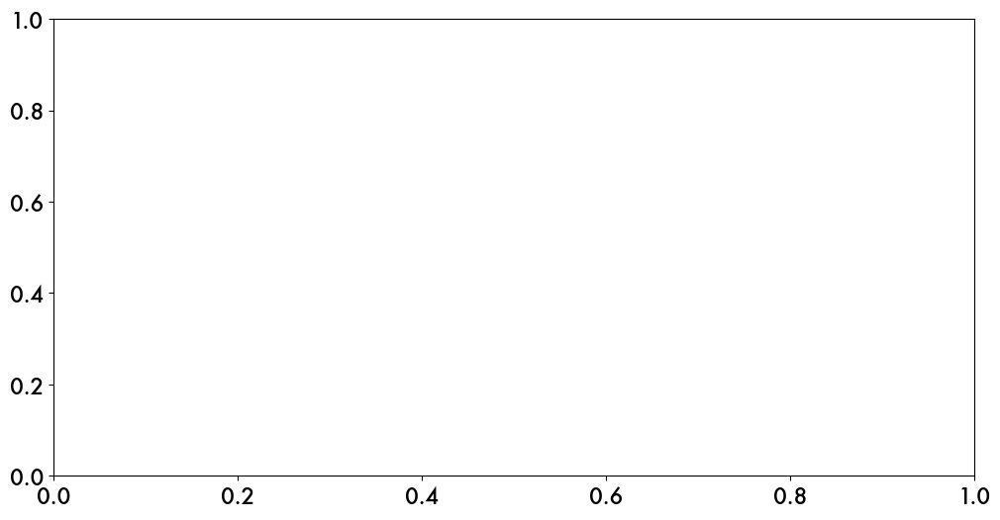

In [3]:
dat = df_660.copy()
dat = dat[(dat.yearday>120) & (dat.yearday<140)]   


fig = plt.figure(figsize=(12,6))
ax = fig.gca()
ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate, s=5)

(400.0, 0.0)

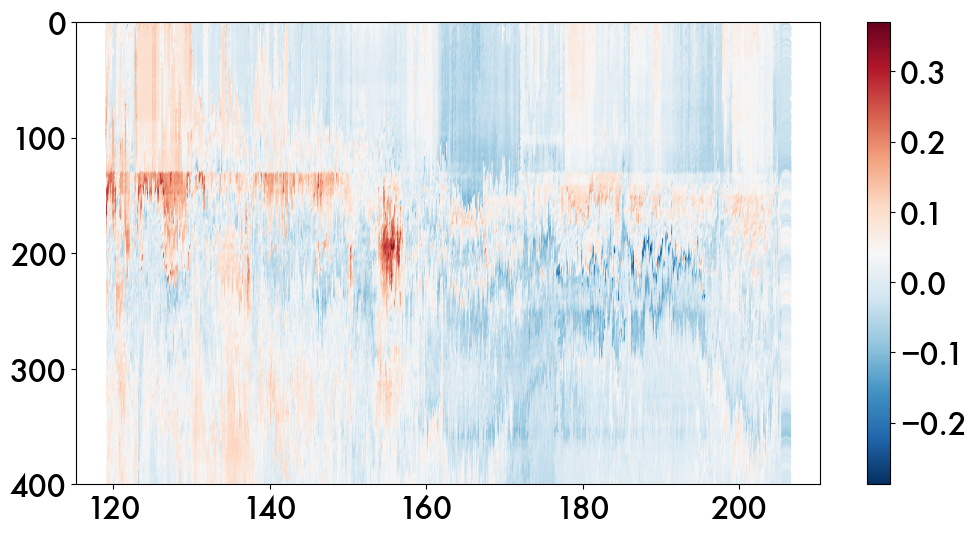

In [314]:
fig = plt.figure(figsize=(12,6))
ax = fig.gca()

sca = ax.scatter(df_659_old.yearday, df_659_old.pressure, c=df_659_old.difference, cmap='RdBu_r')
plt.colorbar(sca, ax=ax)
ax.invert_yaxis()
ax.set_ylim([400,0])


In [531]:
# file_path = '../working-vars/nitrate-prediction/'
# df_659 = pd.read_csv(file_path + 'RFpred_659_RF_modG_1101.csv', index_col=0)
# df_660 = pd.read_csv(file_path + 'RFpred_660_RF_modG_1101.csv', index_col=0)

# full_df_659 = pd.read_csv('../working-vars/glider/df_659_tsO2corr_0928.csv', index_col=0) # for bbp
# full_df_660 = pd.read_csv('../working-vars/glider/df_660_tsO2corr_0928.csv', index_col=0)

In [6]:
file_path = '../working-vars/glider/'
dav_659 = pd.read_csv(file_path + 'dav_659_split2023.csv')
dav_660 = pd.read_csv(file_path + 'dav_660_split2023.csv')

- At this latitude, the inertial period is 15.44 hours, or 0.643

In [365]:
# df_glid = df_659
# glidname = 'sg659'
# prof_list = dfproc.list_profile_DFs(df_glid)
# nitrate_mdl = 'nitrate_28t'

# Plots showing wavelet

In [628]:
plt.style.use("dark_background")

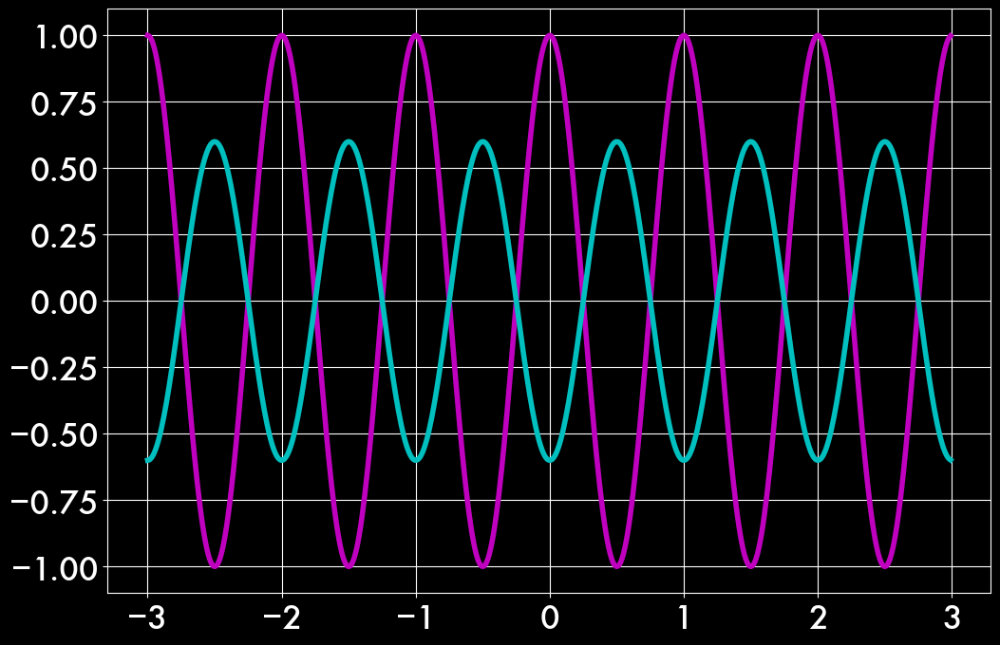

In [641]:
fig = plt.figure(figsize=(12,8))
ax=fig.gca()

# x = np.arange(-2*np.pi, 2*np.pi,0.01)
x = np.arange(-3, 3,0.01)

# Standard
ax.plot(x, np.cos(2*np.pi*x), c='m', linewidth=4)
ax.plot(x, 0.6*np.cos(2*np.pi*(x-0.5)), c='c', linewidth=4)
ax.grid()

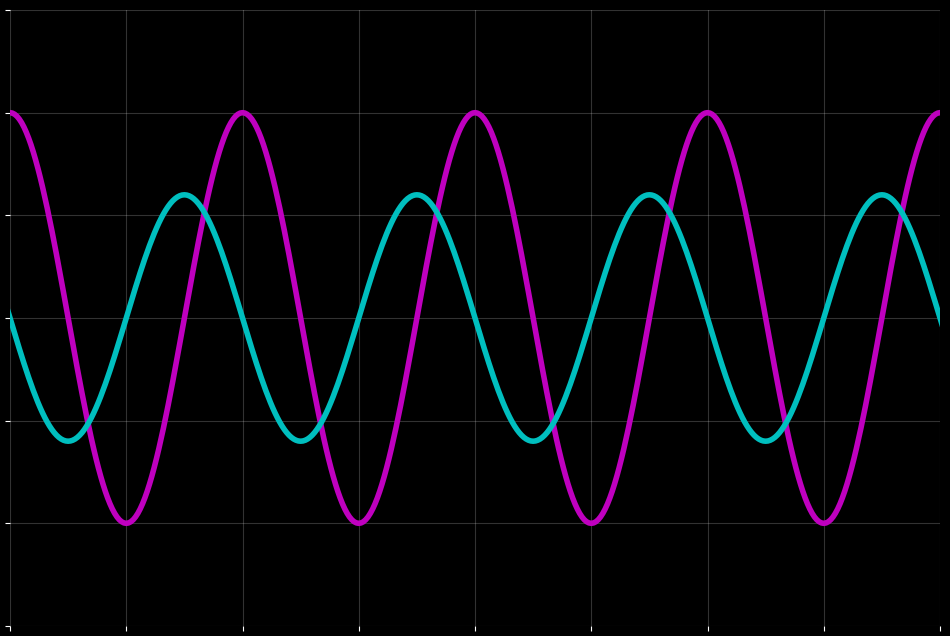

In [646]:
fig = plt.figure(figsize=(12,8))
ax=fig.gca()

# x = np.arange(-2*np.pi, 2*np.pi,0.01)
x = np.arange(-3, 3,0.01)

# Standard
# ax.plot(x, np.cos(2*np.pi*x), c='m', linewidth=4)
# ax.plot(x, 0.6*np.cos(2*np.pi*(x-np.pi/4)), c='c', linewidth=4)

# Low coherence
# ax.plot(x, np.cos(0.5*np.pi*x), c='m', linewidth=4)
# ax.plot(x+.13, 0.6*np.cos(20*np.pi*x), c='c', linewidth=2)

# Quadrature
ax.plot(x, np.cos(2*np.pi*x), c='m', linewidth=4)
ax.plot(x, 0.6*np.cos(2*np.pi*(x+0.25)), c='c', linewidth=4)


plt.grid(color='w', alpha=0.2)
plt.grid(which='minor', color='w', alpha=0.2)


ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])
# ax.set_yticks([])
ax.set_ylim([-1.5,1.5])
ax.set_xlim([-2,2])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Basic profiles of tracers

(900.0, 0.0)

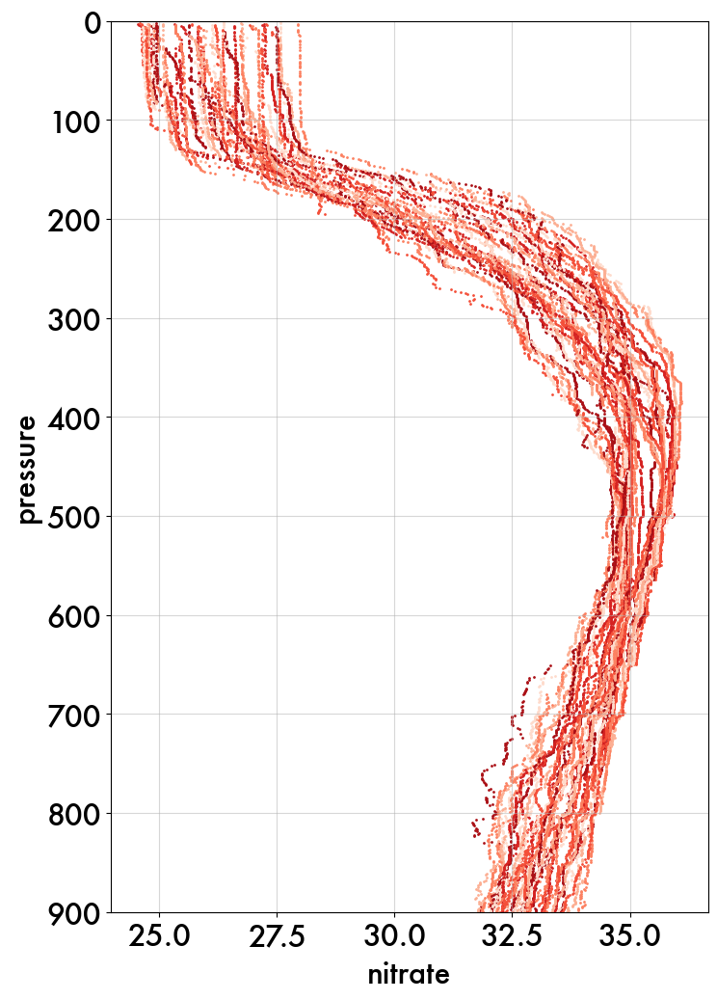

In [393]:
fig = plt.figure(figsize=(8,12))
ax=fig.gca()

for prof in dfproc.list_profile_DFs(df_660)[100:900:20]:
    ax.scatter(prof['nitrate'], prof['pressure'], s=1)

ax.invert_yaxis()
ax.set_xlabel('nitrate')
ax.set_ylabel('pressure')
ax.grid(alpha=0.5, zorder=1)
ax.set_ylim([900,0])


# Find along-isopycnal Surfaces

In [49]:
# Old version: performs the same.
# def get_sigma_signal(prof_list, isopycnal_depths, ave_isopycnal, var_thresh=0.01, depth_thresh = 500):
#     """

#             """

#     dLine = dict.fromkeys(ave_isopycnal) # dSigma or dNitrate

#     for ind, depth in enumerate(isopycnal_depths): 
#         sig = ave_isopycnal[ind] # signal to find in each profile
#         temp = pd.DataFrame()

#         for prof in prof_list:
#             # Find all depths that are within var_thresh of the average signal at that depth
#             rangeDF = pd.DataFrame() 
#             rangeDF = prof[(prof['sigma0']< (sig+var_thresh)) & (prof['sigma0'] > (sig-var_thresh))].copy()

#             # remove outliers from the pressures
#             presdat = rangeDF.pressure 
#             rangeDF = rangeDF[np.abs(presdat - depth) < depth_thresh]
            
#             # first metric: pressure at the average between range
#             rowdat = rangeDF[['yearday', 'pressure', 'sigma0', 'nitrate_28t']].copy().mean()
#             temp = pd.concat([temp, rowdat], axis=1)
            
#         temp = temp.T
#         dLine[sig] = temp

#     return dLine


# vts = 0.005
# bfs = 300
# dSigma = get_sigma_signal(prof_list, [180.1, 262.81], [27.19, 27.34], var_thresh=vts, depth_thresh=bfs)

In [19]:
# Oct 2023: Main method for getting isopycnal signals.
# This version uses a set SIGMA as the list to find rather than by the depths list. 

def get_isopycnal_signal(prof_list, ave_isopycnal, var_thresh=0.01):
    """ 
    @param: prof_list: list of glider DF's 
            ave_isopycnal: list of isopycnal values to find in each profile
            var_thresh: threshold for finding sigma in each profile
    """

    dLine = dict.fromkeys(ave_isopycnal)

    for sig in ave_isopycnal:
        temp = pd.DataFrame()

        for prof in prof_list:
            # Find all sigma points that are within that threshold
            rangeDF = pd.DataFrame() 
            rangeDF = prof[(prof['sigma0']< (sig+var_thresh)) & (prof['sigma0'] > (sig-var_thresh))].copy()

            # Choose mean of values
            rowdat = rangeDF[['yearday', 'pressure', 'sigma0', 'nitrate_G', 'spice', 'oxygen', 'AOU', 'bbp700', 'bbp695', 'bbp470']].copy().mean()
            temp = pd.concat([temp, rowdat], axis=1)
            
        temp = temp.T
        dLine[sig] = temp

    return dLine


# Note that the var_thresh and cutoff values are based on the sigma limits.
# To get more complex nitrate spline fits, see other method from SEP 2023 section 
# isosignal = get_isopycnal_signal(prof_list, ave_isopycnal, var_thresh=0.01)

In [11]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

# Find ave_isopycnal

In [5]:
# ave_isopycnal_659 = np.arange(27.0, 27.7, 0.05).round(2)
# ave_isopycnal_660 = np.arange(27.25, 27.45, 0.05).round(2)

ave_isopycnal_660 = [27.3, 27.4, 27.5, 27.6] #np.arange(27.25, 27.65, 0.05).round(2)
ave_isopycnal_660
var_list = ['yearday', 'pressure', 'sigma0', 'nitrate', 'spice', 'oxygen', 'AOU'] #, 'bbp700', 'bbp695', 'bbp470']
# isosignal_659 = dfproc.get_isopycnal_signal(df_659, ave_isopycnal_659, var_thresh=0.01, var_list = var_list)
isosignal_660 = dfproc.get_isopycnal_signal(df_660, ave_isopycnal_660, var_thresh=0.01, var_list = var_list)


In [7]:
# Method print corresponding depth and nitrate values for each sigma horizon
def print_horizons(isosignal, var = 'pressure'):

    new_dict = dict.fromkeys(isosignal.keys())
    print('sigma ' + '\t' + var)

    for sig in isosignal.keys():
        new_dict[sig] = isosignal[sig][var].mean().round(2)
    
    final = [int(np.round(x)) for x in new_dict.values()]
    sg.print_dict(new_dict)
    print(final)

    return new_dict


In [8]:
# d0_659 = print_horizons(isosignal_659); print()
d0_660 = print_horizons(isosignal_660)

sigma 	pressure
27.3  	174.62
27.4  	223.69
27.5  	296.81
27.6  	396.96
[175, 224, 297, 397]


In [16]:
# ave_isopycnal = ave_isopycnal_660[3:-3:2]
pal = sns.color_palette('Dark2', n_colors = len(ave_isopycnal_660))
sigma_colors = {k:v for k, v in zip(ave_isopycnal_660, pal)}
sigma_colors[27.25] = sns.color_palette('Dark2')[3]
sigma_colors[27.35] = sns.color_palette('Accent')[0]
sigma_colors[27.55] = sns.color_palette('Set2')[1]

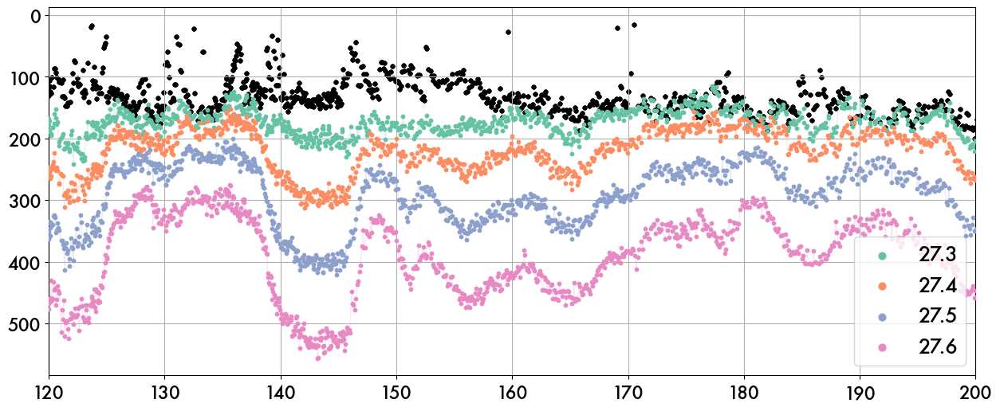

In [13]:
# Print single signal along isopycnals 

sns.set_palette("Set2")
fig = plt.figure(figsize=(15,6))
ax = fig.gca()
for sigma in ave_isopycnal_660: #[27.25, 27.3, 27.4, 27.5, 27.6, 27.7]:
    ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, s=10, label=sigma, zorder=3)
    ax.plot(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, linewidth=1, alpha=0.2, zorder=2)

    ax.scatter(dav_660.yearday, dav_660.mld, s=10, c='k', zorder=1)
# ax.set_ylim([200,0])
ax.set_xlim([120, 200])
ax.grid(zorder=1)
ax.invert_yaxis()

plt.legend(fontsize=18, loc="lower right", markerscale=2)
# plt.title('isopycnal depth, ' + glidtag)

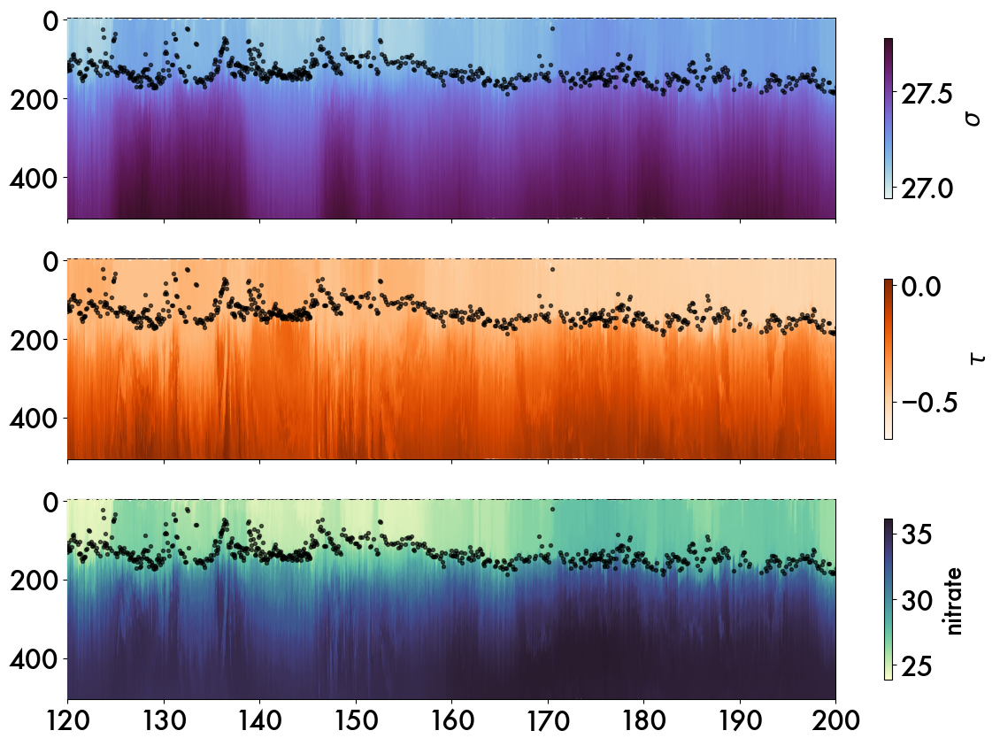

In [451]:
# Show spice, density, and nitrate in 3 subplots
glidtag = 'sg660'

# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()

fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True)
axs = axs.flatten()

depth = 500
df_glid = df_660[df_660.pressure<depth]
sca = axs[0].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.sigma0, cmap=cmo.dense, s=8, zorder=3)
sca2 = axs[1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges', s=8, zorder=3)
sca3 = axs[2].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3)

for ax in axs:
    ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.set_xlim([120, 200])
    ax.invert_yaxis()
    ax.set_ylim([depth+5,-5])

# plt.legend(fontsize=20, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)

plt.colorbar(sca, shrink=0.8).set_label('$\sigma$', fontsize=20)
plt.colorbar(sca2, shrink=0.8).set_label(r'$ \tau $', fontsize=20)
plt.colorbar(sca3, shrink=0.8).set_label('nitrate', fontsize=20)

In [ ]:
# Show spice, density, and nitrate in 3 subplots
glidtag = 'sg660'

# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()

fig, axs = plt.subplots(3,1, figsize=(14,10), sharex=True)
axs = axs.flatten()

depth = 500
df_glid = df_660[df_660.pressure<depth]
sca = axs[0].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.sigma0, cmap=cmo.dense, s=8, zorder=3)
sca2 = axs[1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges', s=8, zorder=3)
sca3 = axs[2].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3)

for ax in axs:
    ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.set_xlim([120, 200])
    ax.invert_yaxis()
    ax.set_ylim([depth+5,-5])

# plt.legend(fontsize=20, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)

plt.colorbar(sca, shrink=0.8).set_label('$\sigma$', fontsize=20)
plt.colorbar(sca2, shrink=0.8).set_label(r'$ \tau $', fontsize=20)
plt.colorbar(sca3, shrink=0.8).set_label('nitrate', fontsize=20)

Text(0.5, 1.0, 'along-isopycnal nitrate')

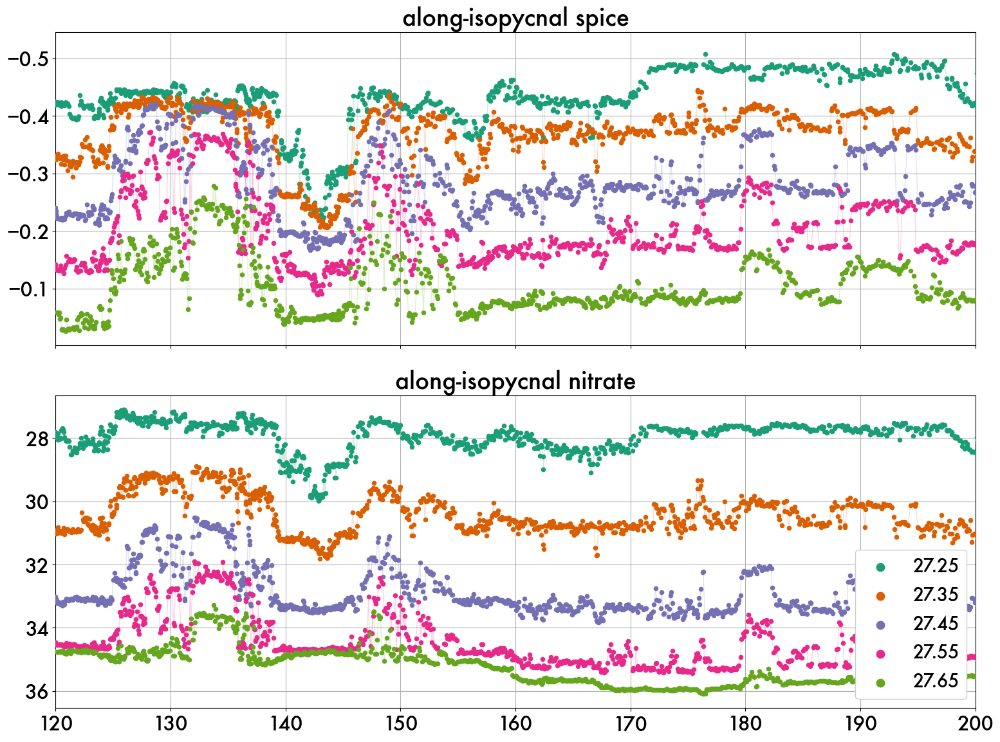

In [93]:
# Make one figure with two subplots: all depth isopycnals, nitrate surfaces
sns.set_palette("Dark2")
isosignal = isosignal_660
ave_isopycnal = ave_isopycnal_660
glidname = ''

fig, axs = plt.subplots(2,1, figsize=(16,12), layout='tight', sharex=True)
axs = axs.flatten()

for sigma in ave_isopycnal[3:-1:2]:
    axs[0].scatter(isosignal[sigma].yearday, isosignal[sigma].spice, s=20, label=sigma, zorder=3)
    axs[0].plot(isosignal[sigma].yearday, isosignal[sigma].spice, linewidth=1, alpha=0.2, zorder=2)


    axs[1].scatter(isosignal[sigma].yearday, isosignal[sigma].nitrate, s=20, label=sigma, zorder=3)
    axs[1].plot(isosignal[sigma].yearday, isosignal[sigma].nitrate, linewidth=1, alpha=0.2, zorder=2)

    
# axs[1].invert_yaxis()
axs[0].set_title('along-isopycnal spice')
for ax in axs:
    ax.set_xlim([120, 200])
    ax.grid(zorder=1)
    ax.invert_yaxis()

axs[1].legend(fontsize=20, markerscale=2., loc="lower right", framealpha=1) #.set_facecolor('w', alpha=0.9)
axs[1].set_title('along-isopycnal nitrate')

In [101]:
isosignal_660[27.1]

,yearday,pressure,sigma0,nitrate,spice,oxygen,AOU,bbp700,bbp695,bbp470
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,119.57923,130.6785,27.104201,25.214527,-0.412554,327.845547,-4.139759,0.000243,0.3904,0.000495
...,...,...,...,...,...,...,...,...,...,...
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


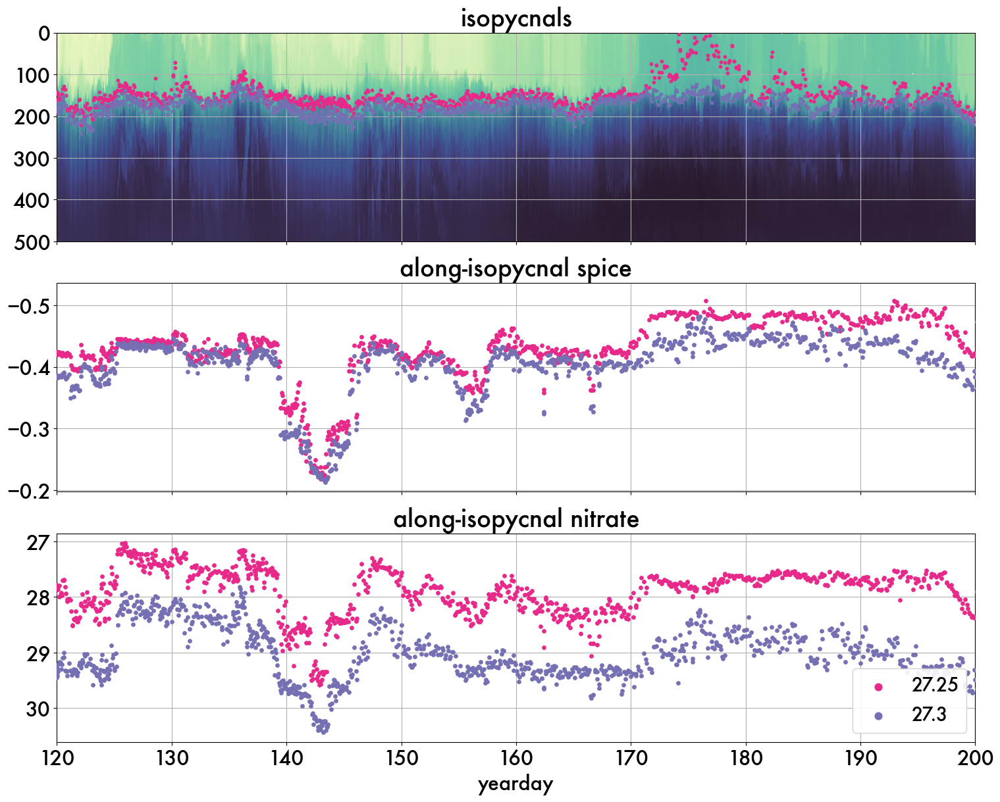

In [488]:
# One figure with three subplots: prediction, signal1, signal2
fig, axs = plt.subplots(3, 1, figsize=(18,14), sharex=True)
axs = axs.flatten()

depth = 500
dat = df_660[df_660.pressure<depth]
sca = axs[0].scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.deep, s=10)
axs[0].set_ylim([0,depth])
axs[0].set_title('isopycnals')

# fig.colorbar(sca, ax=axs[0], label='Nitrate (umol/kg)')
for sigma in ave_isopycnal_660[:2]:
    axs[0].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, s=10, c = sigma_colors[sigma], label=sigma, zorder=3)
    axs[1].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].spice, s=15, c = sigma_colors[sigma], label=sigma, zorder=3)
    axs[2].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].nitrate, s=15, c = sigma_colors[sigma], label=sigma, zorder=3)


axs[1].set_title('along-isopycnal spice')
for ax in axs:
    ax.set_xlim([120, 200])
    ax.grid(zorder=1)
    ax.invert_yaxis()

axs[2].set_title('along-isopycnal nitrate')
axs[2].set_xlabel('yearday')
plt.legend(fontsize=20, markerscale =2, loc="lower right", facecolor='w', framealpha=0.9)

# Make Pyleo Surfaces

In [9]:
def make_along_iso_surfs(isosignal, sigma, var='nitrate'):
    "Returns standardized pyleo surface for along-isopycnal analysis"
    spice_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma].spice, label = sigma,
                  time_name = 'Time', value_name = 'Spice',
                  time_unit = 'days',   value_unit = 's') 
    
    nitrate_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma][var], label = sigma,
                time_name = 'Time', value_name = 'Nitrate',
                time_unit = 'days',   value_unit = 'umol/kg') 
    
    # bbp470_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma]['bbp470'], label = sigma,
    #             time_name = 'Time', value_name = 'bbp470',
    #             time_unit = 'days',   value_unit = '10e4/m') 
    
    # oxygen_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma]['oxygen'], label = sigma,
    #             time_name = 'Time', value_name = 'oxygen',
    #             time_unit = 'days',   value_unit = 'umol/kg') 

    # AOU_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma]['AOU'], label = sigma,
    #             time_name = 'Time', value_name = 'AOU',
    #             time_unit = 'days',   value_unit = 'umol/kg') 

    return spice_surf.standardize(), nitrate_surf.standardize()


In [10]:
def return_surf_dict(ave_isopycnal, isosignal):
    spice_surfs = dict.fromkeys(ave_isopycnal)
    nitrate_surfs = dict.fromkeys(ave_isopycnal)
    # AOU_surfs = dict.fromkeys(ave_isopycnal)

    for sigma in ave_isopycnal:
        [spice_surfs[sigma], nitrate_surfs[sigma]] = make_along_iso_surfs(isosignal, sigma)
        # nitrate_surfs[sigma]] 
        
    return spice_surfs, nitrate_surfs

In [11]:
# Make Pyleo surfaces for spice and nitrate, standardized
# [spice_659, nitrate_659, AOU_659] = return_surf_dict(ave_isopycnal_659, isosignal_659)
[spice_660, nitrate_660] = return_surf_dict(ave_isopycnal_660, isosignal_660)

# Pyleoclim: Power Spectral Density

How to access the amplitude and frequency vectors for each PSD: 

                pressure_psd[27.05].amplitude
                pressure_psd[27.05].frequency

In [27]:
def return_psd_dict(ave_isopycnal, surfs_dict):
    """ 
    @ param ave_isopycnal: list of isopycnal values to find in each profile
            surfs_dict: dictionary of pyleo surfaces either spice_659 or nitrate_659"""
    surfs_psd = dict.fromkeys(ave_isopycnal)
    for sigma in ave_isopycnal:
        surfs_psd[sigma] = surfs_dict[sigma].spectral(method='wwz')
    
    return surfs_psd

In [28]:
# Make Pyleo surfaces for spice and nitrate, standardized
# spice_psd_659= return_psd_dict(ave_isopycnal_659, spice_659)
# nitrate_psd_659 = return_psd_dict(ave_isopycnal_659, nitrate_659)

spice_psd_660 = return_psd_dict(ave_isopycnal_660, spice_660)
nitrate_psd_660 = return_psd_dict(ave_isopycnal_660, nitrate_660)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [578]:
# WARNING: Much longer run time
# comment out below 2 lines 

def return_psd_signif(ave_isopycnal, surfs_psd):
    surfs_psd_signif = dict.fromkeys(ave_isopycnal)
    for sigma in ave_isopycnal:
        surfs_psd_signif[sigma] = surfs_psd[sigma].signif_test(qs=[.90, 0.95], number=50)
    
    return surfs_psd_signif


# spice_psd_signif_659 = return_psd_signif(ave_isopycnal_659[:5], spice_psd_659)
# nitrate_psd_signif_659 = return_psd_signif(ave_isopycnal_659[:5], nitrate_psd_659)

spice_psd_signif_660 = return_psd_signif(ave_isopycnal_660[:5], spice_psd_660)
nitrate_psd_signif_660 = return_psd_signif(ave_isopycnal_660[:5], nitrate_psd_660)


Performing spectral analysis on individual series: 100%|██████████| 50/50 [03:38<00:00,  4.38s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:11<00:00,  5.03s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:16<00:00,  5.13s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:08<00:00,  4.97s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [03:30<00:00,  4.22s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:10<00:00,  5.00s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:17<00:00,  5.16s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:23<00:00,  5.27s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [03:54<00:00,  4.68s/it]
Performing spectral analysis on individual series: 100%|██████████| 50/50 [04:18<00:00,  5.18s/it]
Performing

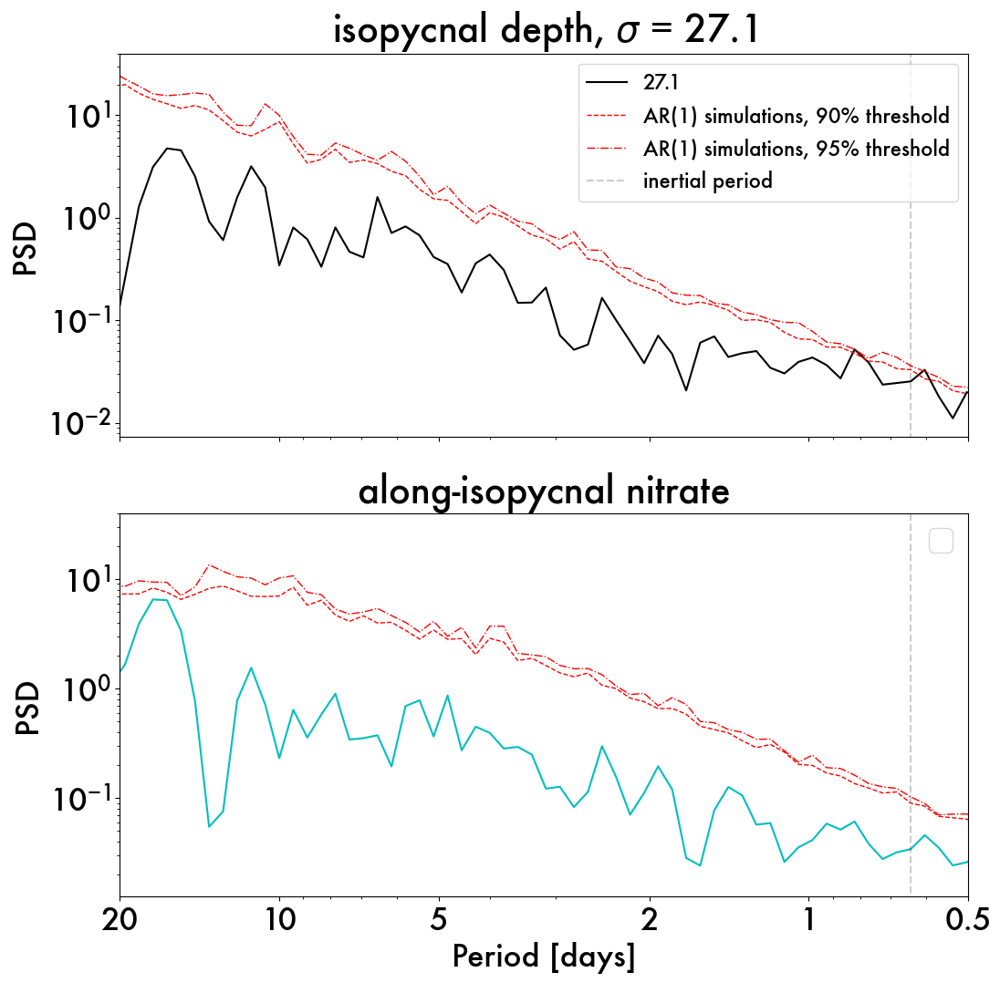

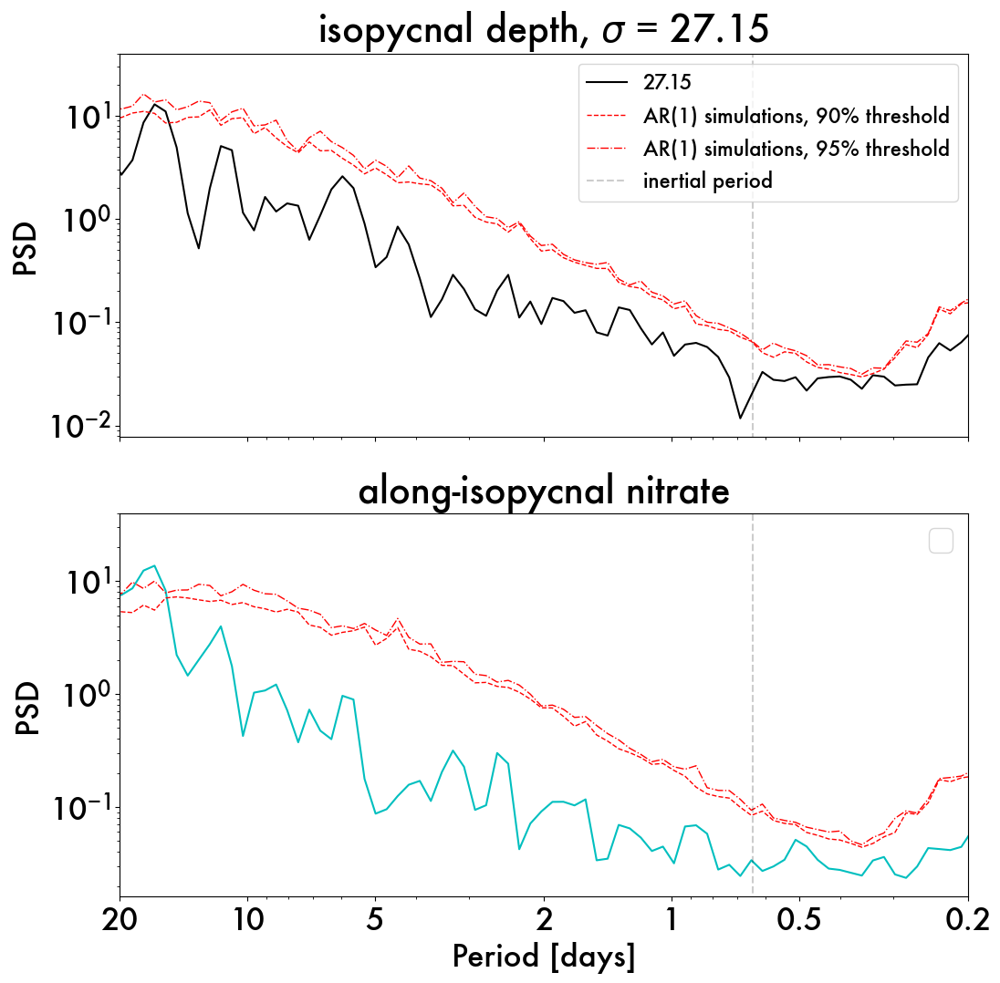

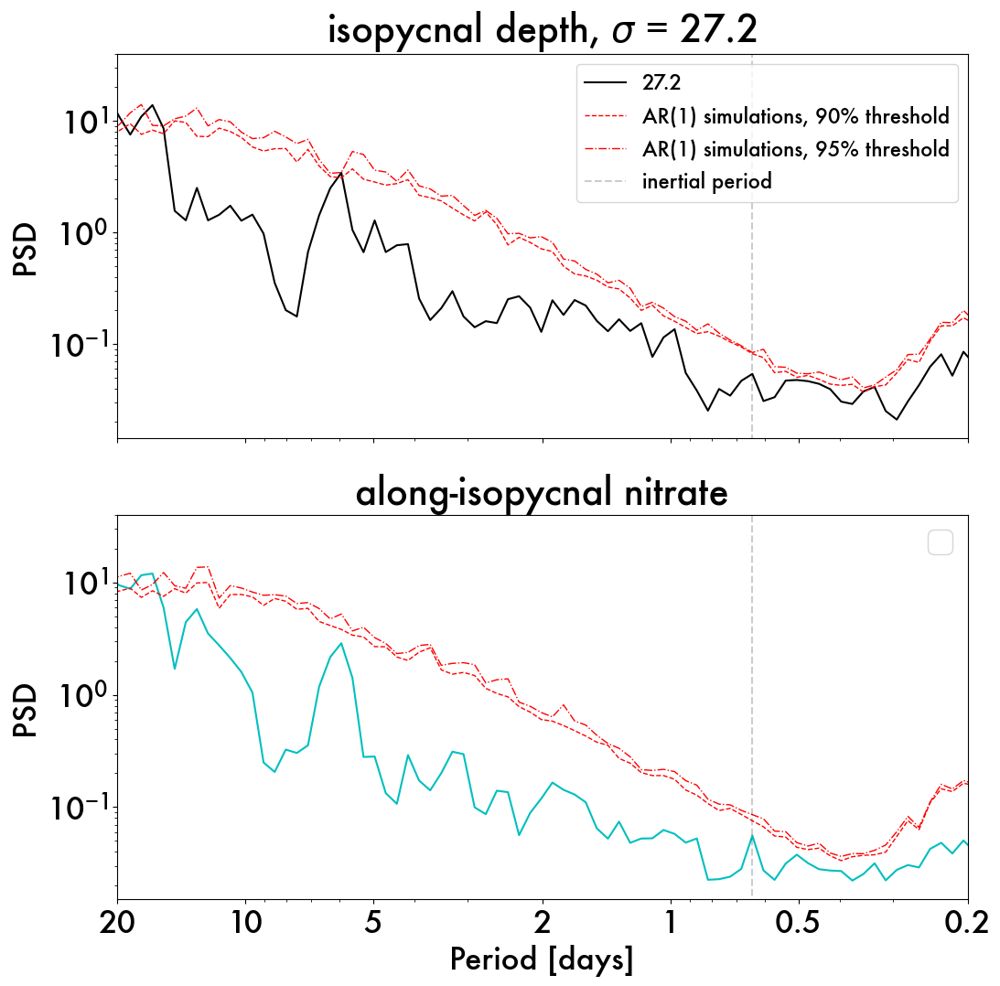

In [623]:
# Make individual plots showing the PSD(significant) for nitrate/density in subplots.
# rerun after the sig plots.. u did something weird with titling

# decay_constant = 5e-4
# be sure to change save name file if saving

for ind, sigma in enumerate(ave_isopycnal_659[2:5]):
    presdat= spice_psd_signif_659[sigma]
    nitdat = nitrate_psd_signif_659[sigma]

    # presdat = sigpsd_test
    # nitdat = nitpsd_test

    # fig = plt.figure(figsize=(12,6))
    fig, axs = plt.subplots(2, 1, figsize=(12, 12), sharex=True)
    axs = axs.flatten()

    presdat.plot(ax=axs[0], color='k')
    axs[0].set_title('isopycnal depth, ' + r'$\sigma$' + ' = ' + str(sigma))
    axs[0].set_xlabel('')

    nitdat.plot(ax=axs[1], color='c')
    axs[1].set_title('along-isopycnal nitrate')

    for ax in axs:
        ax.vlines(0.643, 0,40, color='k', linestyle='dashed', alpha=0.2, label='inertial period')
        ax.set_ylim([0, 40])
    
    axs[0].legend(fontsize=16)
    axs[1].legend('')

    # tag = d0_list[ind]
    # plt.savefig('../figures/660_wwz_iso_sigpsd_' + str(tag) + 'm.png', dpi=300)

In [571]:
# Choose what to plot here
isosignal = isosignal_659
ave_isopycnal = ave_isopycnal_659
glidname = 'sg659'
df_glid = df_659

In [574]:
# For plotting (choose nitrte or sigma)
choice = 'spice'
choice_psd = spice_psd_659

Text(0.5, 1.0, 'PSD along-isopycnal spice, sg659')

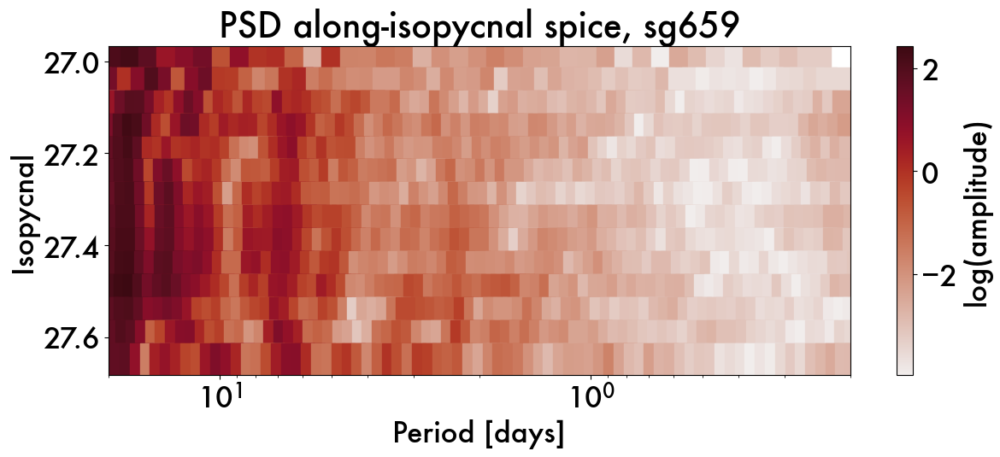

In [575]:
# Plot PSD of a variable over depths
fig = plt.figure(figsize=(14,5))
ax = plt.gca()

# sns.set_palette("Set2")

for sigma in ave_isopycnal:
    dat = choice_psd[sigma]

    freq_vector = 1/dat.frequency # x-axis
    amplitude = np.log(dat.amplitude)  # color of point
    sigma_vector = np.tile(sigma, len(freq_vector)) # y-axis

    sca = ax.scatter(freq_vector, sigma_vector, c=amplitude, s=800, marker='s', cmap=cmo.amp)

ax.set_xscale('log')
ax.set_xlim([20, 0.2])
ax.invert_yaxis()

ax.set_xlabel('Period [days]')
ax.set_ylabel('Isopycnal')
plt.colorbar(sca, label='log(amplitude)')
plt.title('PSD along-isopycnal ' + choice + ', ' + glidname)


# Continuous Wavelet Transform (CWT)

In [12]:
# Make scalogram dictionaries 
def return_wavelet_transform(ave_isopycnal, surfs_dict):
    """ 
    @param:     surfs_dict: either spice_659 or nitrate_659"""
    surfs_scalogram = dict.fromkeys(ave_isopycnal)
    for sigma in ave_isopycnal:
        surfs_scalogram[sigma] = surfs_dict[sigma].wavelet(method='wwz')
    
    return surfs_scalogram

# spice_scal_659 = return_wavelet_transform(ave_isopycnal_659, spice_659)
# nitrate_scal_659 = return_wavelet_transform(ave_isopycnal_659, nitrate_659)
# AOU_scal_659 = return_wavelet_transform(ave_isopycnal_659, AOU_659)


# To compute for all sigmas
spice_scal_660 = return_wavelet_transform(ave_isopycnal_660, spice_660)
nitrate_scal_660 = return_wavelet_transform(ave_isopycnal_660, nitrate_660)
# AOU_scal_660 = return_wavelet_transform(ave_isopycnal_660, AOU_660)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [30]:
# to run on select sigmas
for sigma in [27.25]:
    spice_scal_660[sigma] = spice_660[sigma].wavelet(method='wwz')
    nitrate_scal_660[sigma] = nitrate_660[sigma].wavelet(method='wwz')


KeyboardInterrupt: 

In [32]:
# WARNING: Long run time! ~2hr
# Make *significant* scalogram dictionaries 
def return_transform_signif(ave_isopycnal, scalogram_dict, nsim=50):
    """ 
    @param  scalogram_dict: either spice_scal_659 or nitrate_scal_659
            use nsim (number of simulations) = 50 for now, 1000 later)"""
    surfs_scalogram_signif = dict.fromkeys(ave_isopycnal)
    for sigma in tqdm(ave_isopycnal):
        surfs_scalogram_signif[sigma] = scalogram_dict[sigma].signif_test(method='ar1sim', number=nsim)

    return surfs_scalogram_signif

# spice_scal_signif_659 = return_transform_signif(ave_isopycnal_659, spice_scal_659)
# nitrate_scal_signif_659 = return_transform_signif(ave_isopycnal_659, nitrate_scal_659)

spice_scal_signif_660 = return_transform_signif(ave_isopycnal_660, spice_scal_660, nsim=1000)
nitrate_scal_signif_660 = return_transform_signif(ave_isopycnal_660, nitrate_scal_660, nsim=1000)


  0%|          | 0/4 [00:00<?, ?it/s]

Performing wavelet analysis on individual series:   6%|▌         | 3/50 [00:12<03:17,  4.21s/it]
  0%|          | 0/4 [00:12<?, ?it/s]


KeyboardInterrupt: 

In [14]:
# BETTER WAY TO DO NSIM=1000 CWT SIGNIF TEST 
# ave_isopycnal = [27.3, 27.4, 27.5, 27.6, 27.7]
nsim=1000

# comment out to not lose any runs!!
# nitrate_scal_signif_660 = dict.fromkeys(ave_isopycnal_660)
# spice_scal_signif_660 = dict.fromkeys(ave_isopycnal_660)

for sigma in tqdm([27.3, 27.4, 27.5, 27.6]):
    nitrate_scal_signif_660[sigma] = nitrate_scal_660[sigma].signif_test(method='ar1sim', number=nsim)
    spice_scal_signif_660[sigma] = spice_scal_660[sigma].signif_test(method='ar1sim', number=nsim)


100%|██████████| 4/4 [25:31:06<00:00, 22966.72s/it]  


100%|██████████| 3/3 [00:00<00:00, 46.60it/s]


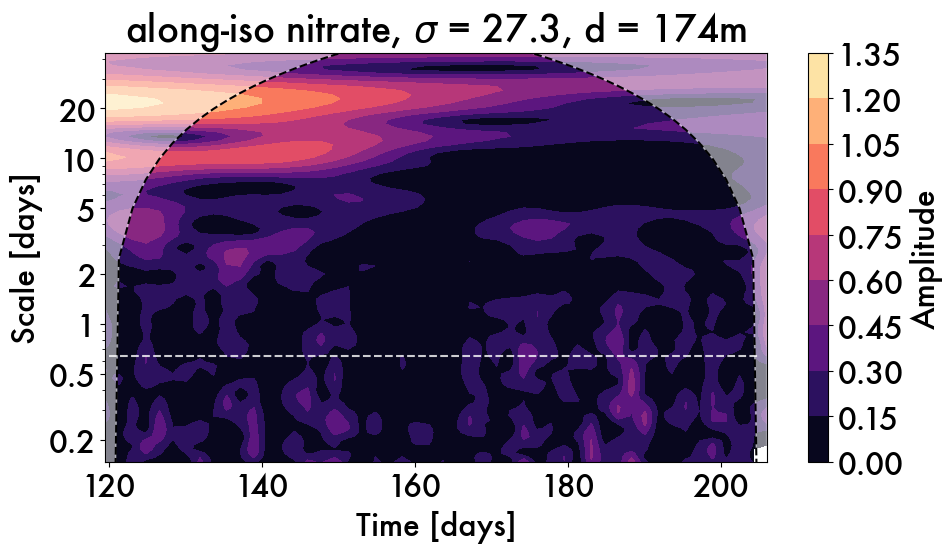

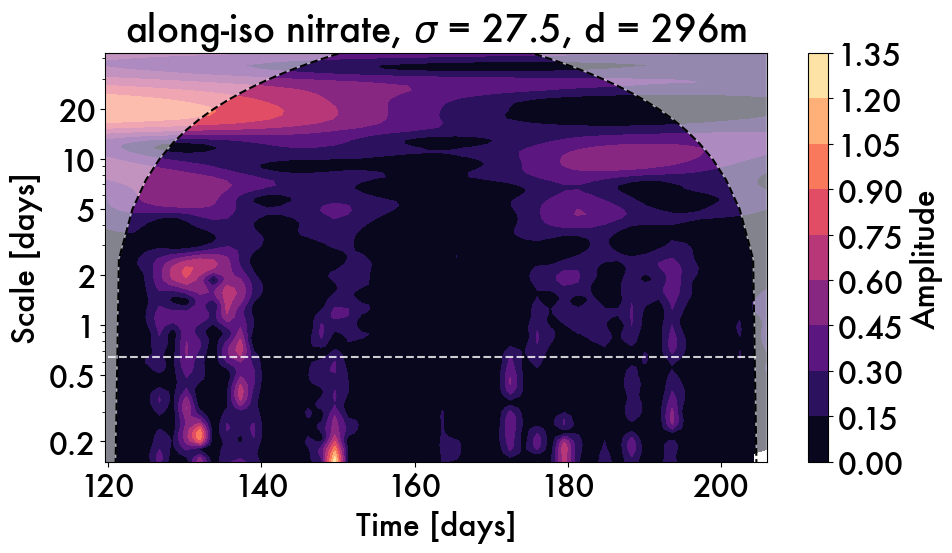

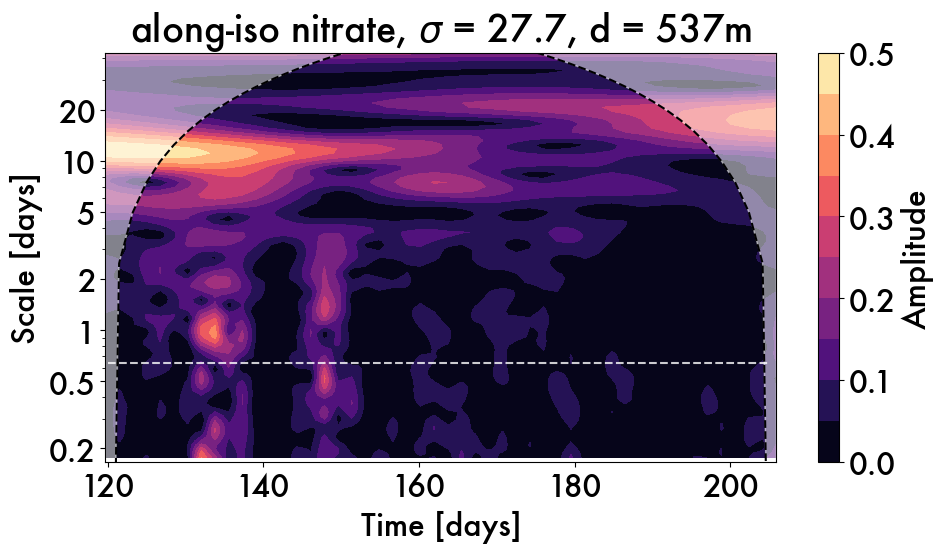

In [116]:
for sigma in tqdm(ave_isopycnal[4:14:4]):
    wavelet = nitrate_scal_660[sigma] # _signif
    fig = plt.figure(figsize=(10,6), layout="tight") # 14,7
    ax=fig.gca()

    tag = 'along-iso nitrate, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
    wavelet.plot(ax=ax, title=tag, in_scale=True)
    # ax.set_title(tag)
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    # ax.invert_yaxis()
    # ax.set_ylim([0,5])
    # ax.set_xlim([120,159])

    # plt.savefig('../figures/660_isopycnal_wavelet_sig_' + str(sigma) + '.png', dpi=300)

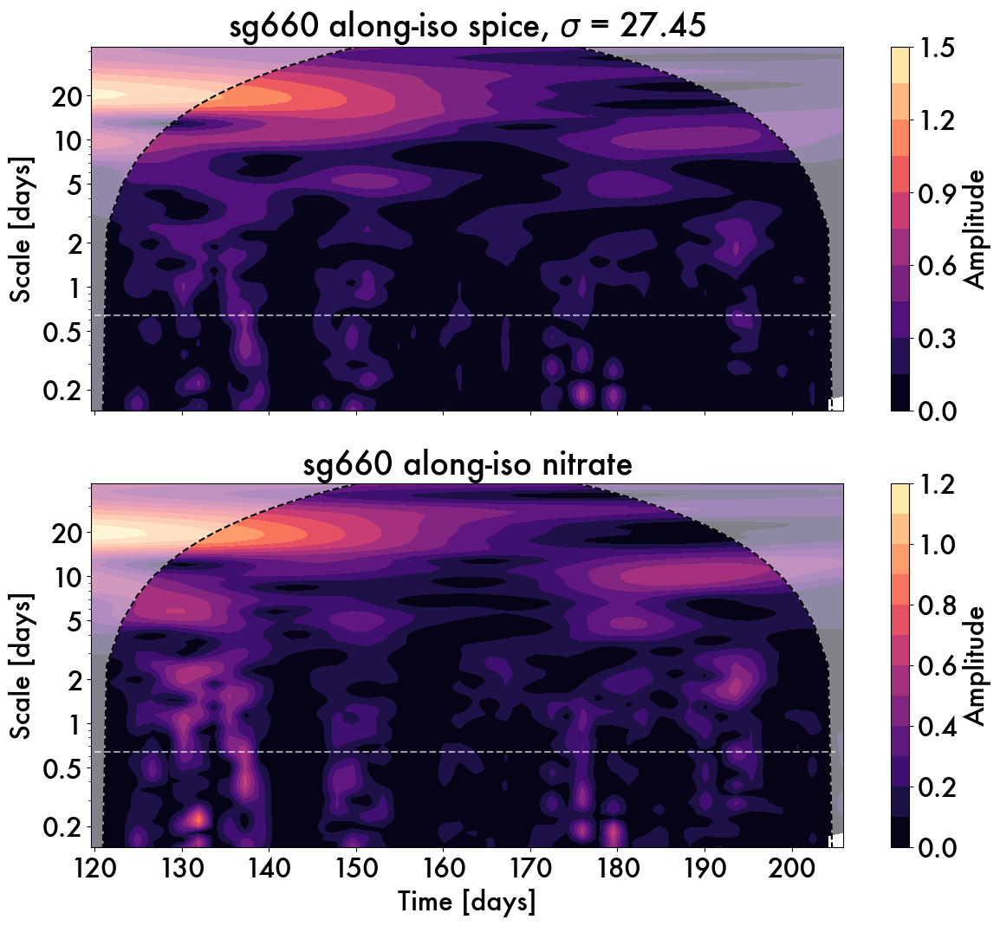

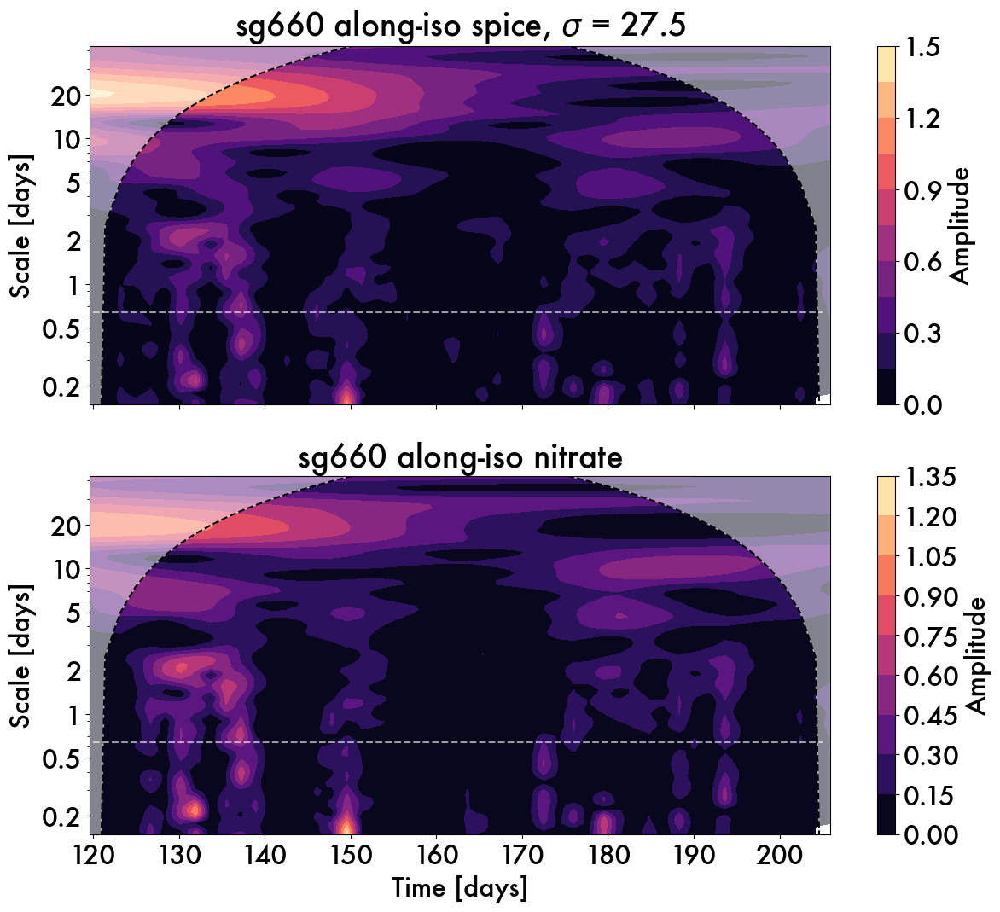

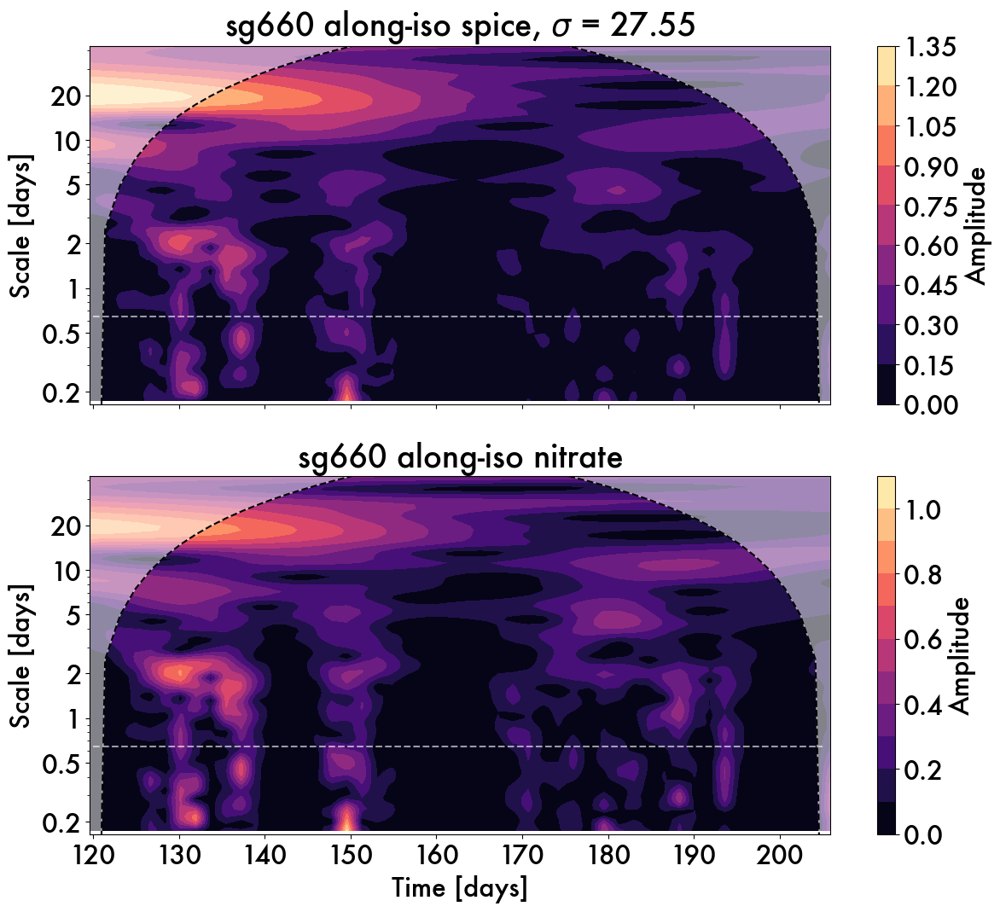

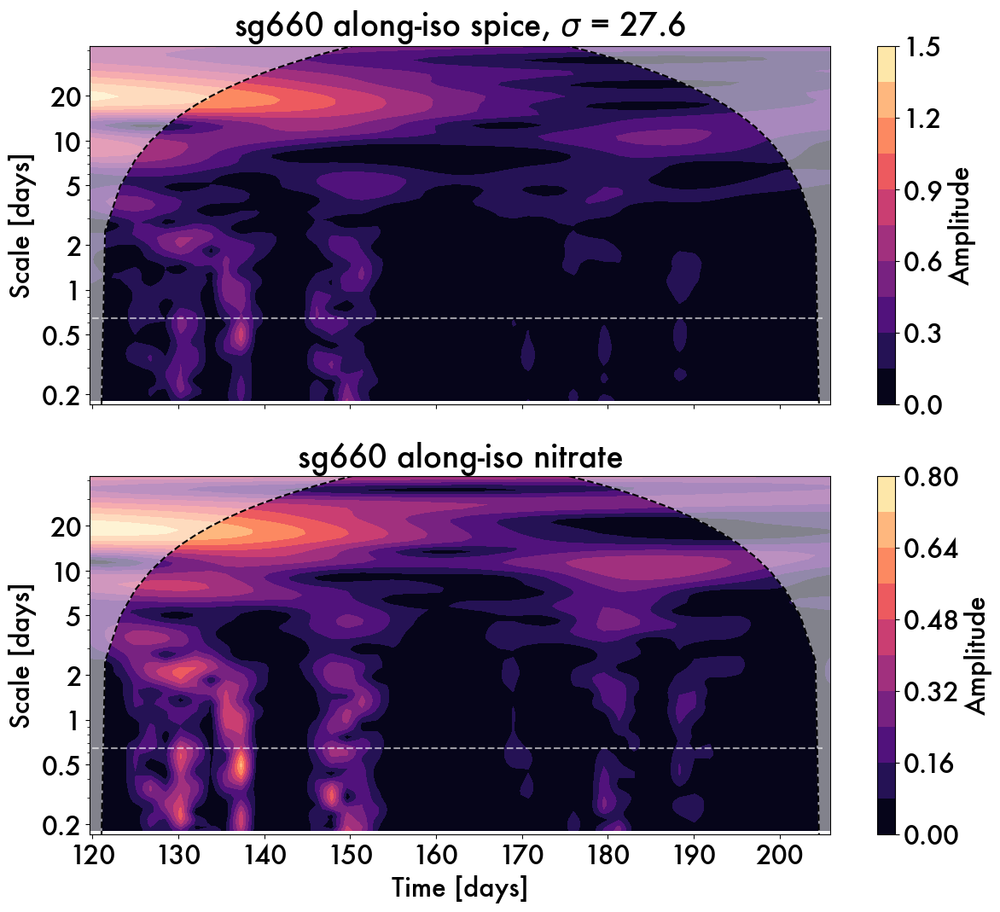

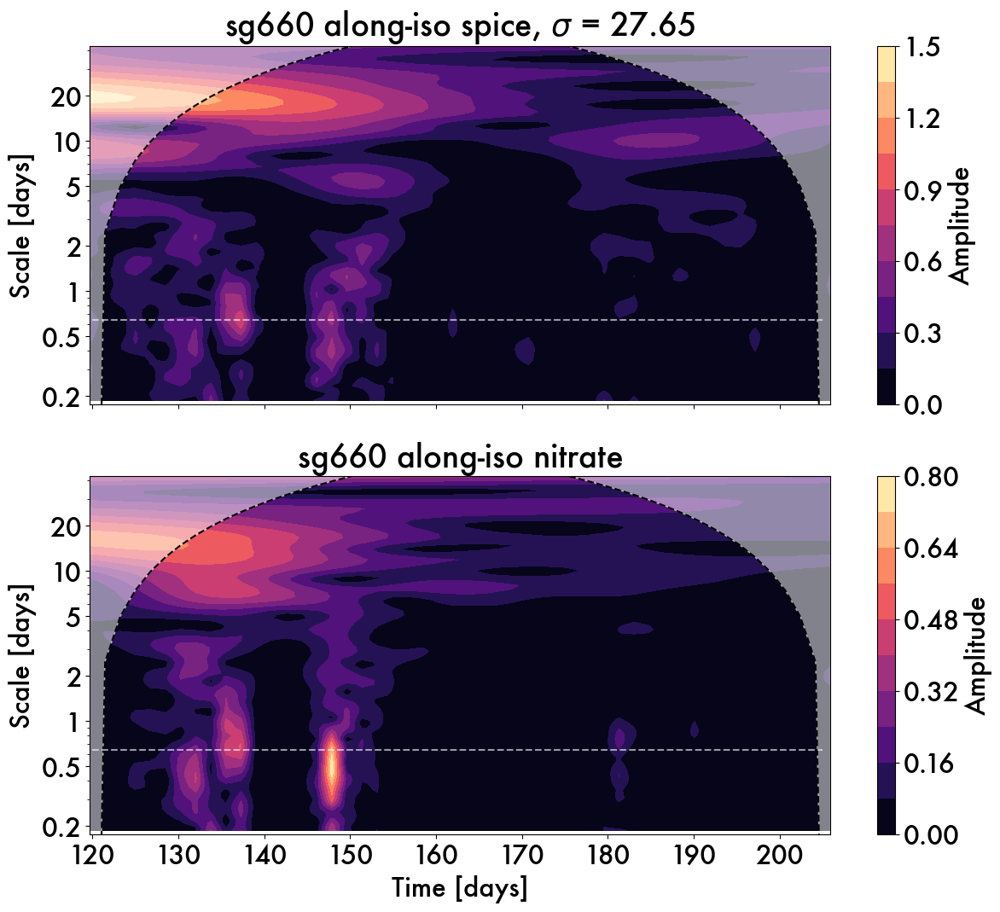

In [88]:
# Visualize the new individual scalograms at 6 depths(); 6 figures)

for ind, sigma in enumerate(ave_isopycnal_660[7:12]):
    nit_scal = nitrate_scal_660[sigma]  # _signif
    spice_scal = spice_scal_660[sigma]

    # fig = plt.figure(figsize=(12,6))
    fig, axs = plt.subplots(2, 1, figsize=(14, 12), sharex=True)
    axs = axs.flatten()

    tag = 'sg660 along-iso spice, ' + r'$\sigma$' + ' = ' + str(sigma)   # , d0 = ' + str(sigma) + 'm'
    spice_scal.plot(ax=axs[0], title=tag, in_scale=True)  # inscale false makes it in freqency
    axs[0].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.6, label='inertial period')


    tag = 'sg660 along-iso nitrate'
    nit_scal.plot(ax=axs[1], title=tag, in_scale=True)
    axs[0].set_xlabel('')
    axs[1].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.6, label='inertial period')

    # tag = d0_list[ind]
    # plt.savefig('../figures/660_isopycnal_scals_' + str(tag) + '.png', dpi=300)


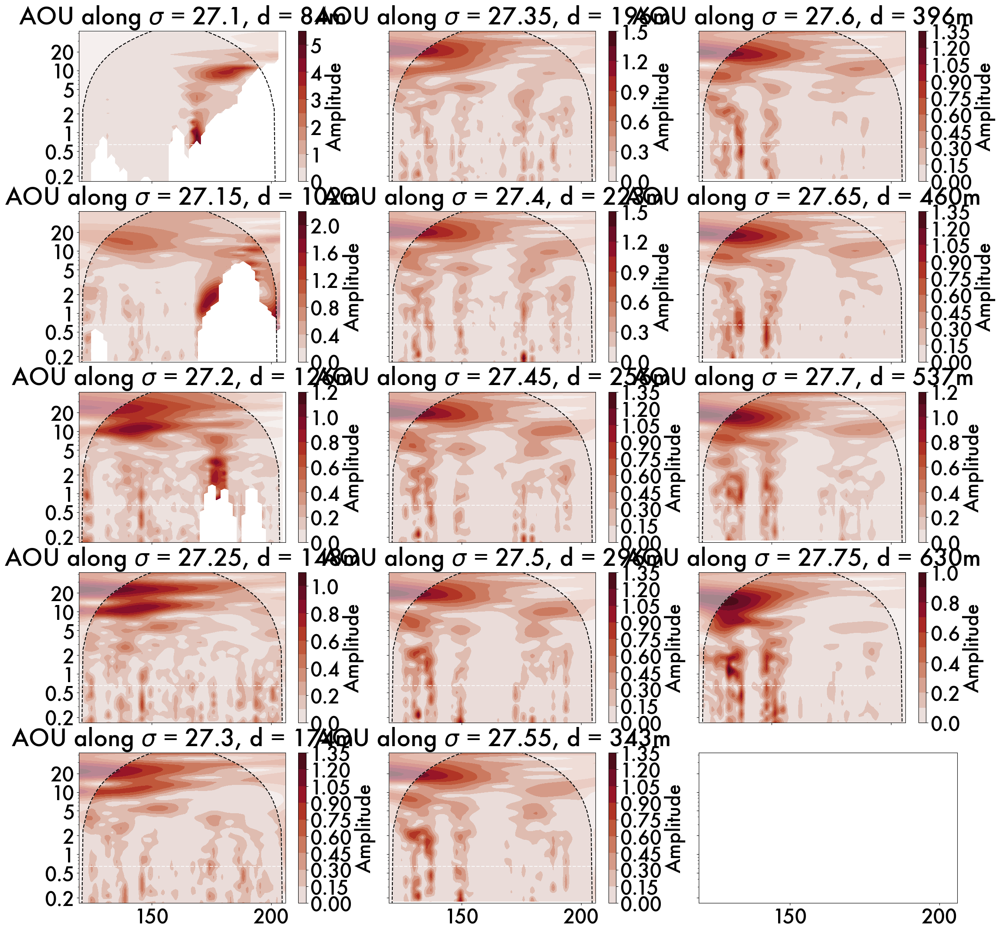

In [22]:
# One big plot for AOU wavelet
# fig, axs = plt.subplots(6, 2, figsize=(20, 26), sharex=True, sharey=True)
# axs = axs.flatten()

ave_isopycnal = ave_isopycnal_660
scal = AOU_scal_660


fig, axs = plt.subplots(5,3, figsize=(26, 26), sharex=True, sharey=True)
# axs = axs.flatten()

for ind, sigma in enumerate(ave_isopycnal[0:5]):
    sca = scal[sigma]
    sca.plot(ax=axs[ind, 0], title='', contourf_style={'cmap':cmo.amp})
    axs[ind,0].set_title('AOU along ' + r'$\sigma$' + ' = ' + str(sigma)+ ', d = ' + str(int(d0_660[sigma])) + 'm')

for ind, sigma in enumerate(ave_isopycnal[5:10]):
    sca = scal[sigma]
    sca.plot(ax=axs[ind, 1], title='', contourf_style={'cmap':cmo.amp})
    axs[ind,1].set_title('AOU along ' + r'$\sigma$' + ' = ' + str(sigma)+ ', d = ' + str(int(d0_660[sigma])) + 'm')

for ind, sigma in enumerate(ave_isopycnal[10:]):
    sca = scal[sigma]
    sca.plot(ax=axs[ind, 2], title='', contourf_style={'cmap':cmo.amp})
    axs[ind,2].set_title('AOU along ' + r'$\sigma$' + ' = ' + str(sigma)+ ', d = ' + str(int(d0_660[sigma])) + 'm')


for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

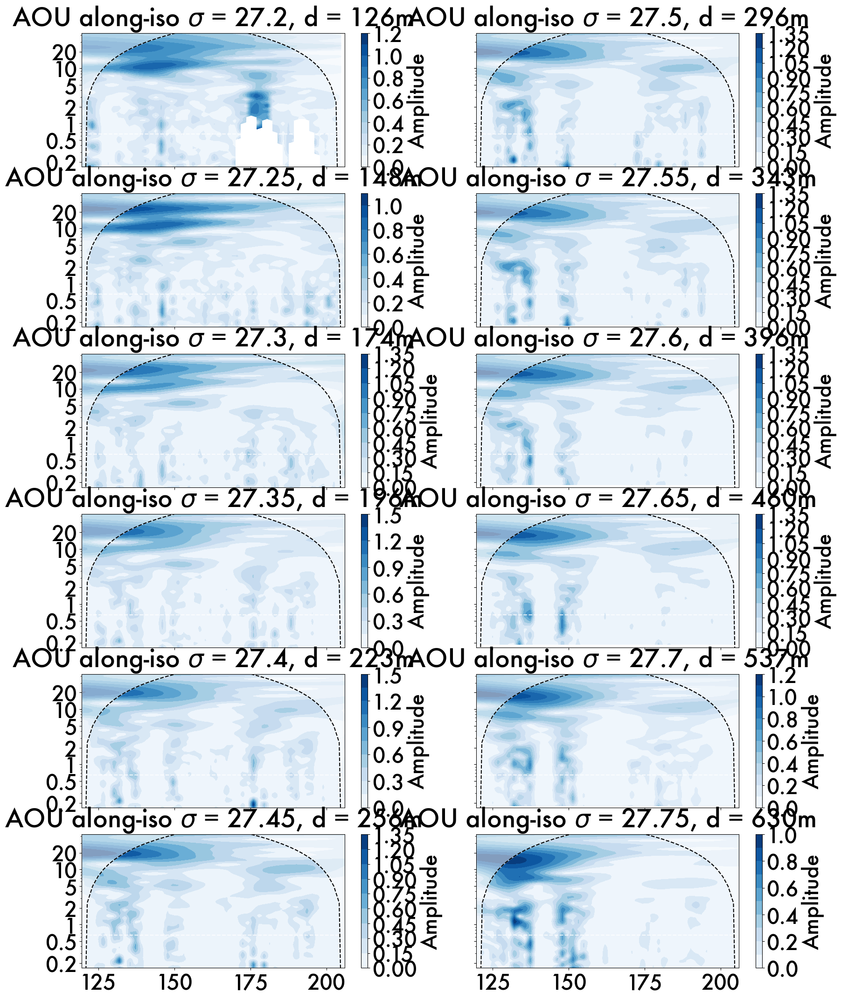

In [36]:
# One big plot for AOU wavelet
fig, axs = plt.subplots(6, 2, figsize=(20, 26), sharex=True, sharey=True)
# axs = axs.flatten()

for ind, sigma in enumerate(ave_isopycnal[2:8]):
    coh = AOU_scal_660[sigma]
    coh.plot(ax=axs[ind, 0], title='', contourf_style={'cmap':'Blues'})
    axs[ind,0].set_title('AOU along-iso ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

for ind, sigma in enumerate(ave_isopycnal[8:]):
    coh = AOU_scal_660[sigma]
    coh.plot(ax=axs[ind, 1], title='', contourf_style={'cmap':'Blues'})
    axs[ind,1].set_title('AOU along-iso ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

In [85]:
spice_scal_signif_660

{27.3: <pyleoclim.core.scalograms.Scalogram at 0x4a7784790>,
 27.4: <pyleoclim.core.scalograms.Scalogram at 0x649a38e50>,
 27.5: <pyleoclim.core.scalograms.Scalogram at 0x7bd468ee0>,
 27.6: <pyleoclim.core.scalograms.Scalogram at 0x7a5c55910>}

In [463]:
nitrate_scal_signif_660

{27.5: <pyleoclim.core.scalograms.Scalogram at 0x823376a30>,
 27.3: <pyleoclim.core.scalograms.Scalogram at 0x820f82700>,
 27.4: <pyleoclim.core.scalograms.Scalogram at 0x7b57feeb0>,
 27.6: <pyleoclim.core.scalograms.Scalogram at 0x8042658e0>,
 27.7: <pyleoclim.core.scalograms.Scalogram at 0x81f84cd60>,
 27.25: <pyleoclim.core.scalograms.Scalogram at 0xa9fb1c460>,
 27.35: <pyleoclim.core.scalograms.Scalogram at 0x9c83dd130>}

https://pyleoclim-util.readthedocs.io/en/v0.7.4/core/ui.html#scalogram-pyleoclim-scalogram

https://pyleoclim-util.readthedocs.io/en/v0.7.4/_modules/pyleoclim/core/ui.html#Scalogram.plot

In [ ]:
# cwt.plot(variable='amplitude', in_period=True, xlabel=None, ylabel=None, title=None, ylim=None, xlim=None, yticks=None, figsize=[10, 8], mute=False, 
#      signif_clr='white', signif_linestyles='-', signif_linewidths=1, contourf_style={}, cbar_style={}, savefig_settings={}, ax=None)

In [99]:
size = 28
plt.style.use('default')
params = {'legend.fontsize': size-4, 
          'axes.titlesize':size,
          'xtick.labelsize':size, 
          'ytick.labelsize':size, 
          'font.size':size,
          'font.family':'Futura'}
plt.rcParams.update(params)

In [23]:
plt.rcParams.update(my_params(16))

In [ ]:
    # cwt = nitrate_scal_signif_660[sigma]
    # cwt.plot(ax=axs[ind, 0], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.3}, signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1,
    #          cbar_style={'label':'', 'ticks':[0.0, 0.3, 0.6, 0.9, 1.2]})
    # axs[ind,0].set_title(r'$\sigma_0$' + ' = ' + str(sigma) + ', ' + r'$\mathregular{\bar{d}}$' + ' = ' + str(int(d0_660[sigma])) + ' m',

In [31]:
nitrate_scal_signif_660[27.5].frequency

array([0.02317065, 0.02453385, 0.02597726, 0.02750559, 0.02912383,
       0.03083729, 0.03265155, 0.03457254, 0.03660656, 0.03876025,
       0.04104064, 0.0434552 , 0.04601181, 0.04871884, 0.05158513,
       0.05462005, 0.05783353, 0.06123607, 0.06483879, 0.06865347,
       0.07269258, 0.07696932, 0.08149769, 0.08629246, 0.09136934,
       0.0967449 , 0.10243672, 0.10846341, 0.11484467, 0.12160136,
       0.12875557, 0.13633069, 0.14435148, 0.15284415, 0.16183648,
       0.17135786, 0.18143941, 0.19211409, 0.2034168 , 0.21538448,
       0.22805626, 0.24147357, 0.25568026, 0.27072277, 0.28665029,
       0.30351488, 0.32137166, 0.34027902, 0.36029876, 0.38149633,
       0.40394102, 0.42770621, 0.45286958, 0.4795134 , 0.50772476,
       0.53759589, 0.56922444, 0.6027138 , 0.63817345, 0.6757193 ,
       0.71547411, 0.75756782, 0.80213804, 0.84933048, 0.8992994 ,
       0.95220817, 1.00822973, 1.06754722, 1.13035456, 1.19685706,
       1.26727212, 1.34182994, 1.42077424, 1.50436309, 1.59286

In [32]:
cwdat = nitrate_scal_signif_660[27.5]

In [61]:
nitscal_freq

,27.3,27.4,27.5,27.6
0,0.023152,NaN,NaN,NaN
1,0.024540,NaN,NaN,NaN
2,0.026011,NaN,NaN,NaN
3,0.027569,NaN,NaN,NaN
4,0.029221,NaN,NaN,NaN
...,...,...,...,...
94,5.502681,NaN,NaN,NaN
95,5.832446,NaN,NaN,NaN
96,6.181973,NaN,NaN,NaN
97,6.552446,NaN,NaN,NaN


# Save significant values

In [72]:
# Save significant nitrate scalogram values!
save = False
dir = '../working-vars/ML-wavelet/'

nitscal_freq = pd.DataFrame(index=range(100), columns = ave_isopycnal_660)
nitscal_xtime = pd.DataFrame(columns = ave_isopycnal_660)
nitscal_coi = pd.DataFrame(columns = ave_isopycnal_660)

# 
nitscal_freq[27.3][:-1] = nitrate_scal_signif_660[27.3].frequency
for sig in ave_isopycnal_660[1:]:
    nitscal_freq[sig] = nitrate_scal_signif_660[sig].frequency

for sig in ave_isopycnal_660:
    nitscal_xtime[sig] = nitrate_scal_signif_660[sig].time
    nitscal_coi[sig] = nitrate_scal_signif_660[sig].coi

if save:
    nitscal_xtime.to_csv(dir + 'nitscal660_xtime.csv')
    nitscal_freq.to_csv(dir + 'nitscal660_freq.csv')
    nitscal_coi.to_csv(dir + 'nitscal660_coi.csv')


for sig in ave_isopycnal_660:
    cwdat = nitrate_scal_signif_660[sig]
    zamp = pd.DataFrame(cwdat.amplitude.T)
    signif_amp = pd.DataFrame(cwdat.signif_qs.scalogram_list[0].amplitude.T)

    if save:
        zamp.to_csv(dir + 'nitscal660_zamp_' + str(np.int(sig*10)) + '.csv')
        signif_amp.to_csv(dir + 'nitscal660_signif_amp_' + str(np.int(sig*10)) + '.csv')


,27.3,27.4,27.5,27.6
0,0.023152,0.023167,0.023171,0.023194
1,0.02454,0.024535,0.024534,0.024526
2,0.026011,0.025984,0.025977,0.025934
3,0.027569,0.027518,0.027506,0.027423
4,0.029221,0.029143,0.029124,0.028998
...,...,...,...,...
95,5.832446,5.394406,5.291268,4.667391
96,6.181973,5.712947,5.602571,4.935415
97,6.552446,6.050298,5.932189,5.218831
98,6.94512,6.407569,6.281199,5.518521


In [89]:
# Same save procedure for spice.

save = True
dir = '../working-vars/ML-wavelet/'

spiscal_freq = pd.DataFrame(index=range(100), columns = ave_isopycnal_660)
spiscal_xtime = pd.DataFrame(columns = ave_isopycnal_660)
spiscal_coi = pd.DataFrame(columns = ave_isopycnal_660)

# 
spiscal_freq[27.3][:-1] = spice_scal_signif_660[27.3].frequency
for sig in ave_isopycnal_660[1:]:
    spiscal_freq[sig] = spice_scal_signif_660[sig].frequency

for sig in ave_isopycnal_660:
    spiscal_xtime[sig] = spice_scal_signif_660[sig].time
    spiscal_coi[sig] = spice_scal_signif_660[sig].coi

if save:
    spiscal_xtime.to_csv(dir + 'spiscal660_xtime.csv')
    spiscal_freq.to_csv(dir + 'spiscal660_freq.csv')
    spiscal_coi.to_csv(dir + 'spiscal660_coi.csv')

for sig in ave_isopycnal_660:
    cwdat = spice_scal_signif_660[sig]
    zamp = pd.DataFrame(cwdat.amplitude.T)
    signif_amp = pd.DataFrame(cwdat.signif_qs.scalogram_list[0].amplitude.T)

    if save:
        zamp.to_csv(dir + 'spiscal660_zamp_' + str(np.int(sig*10)) + '.csv')
        signif_amp.to_csv(dir + 'spiscal660_signif_amp_' + str(np.int(sig*10)) + '.csv')

## Read back in for rerun: 

In [ ]:
# # Best way to rerun
# dir = '../working-vars/ML-wavelet/'
# nitscal_xtime = pd.read_csv(dir + 'nitscal660_xtime.csv', index_col=0)
# nitscal_freq = pd.read_csv(dir + 'nitscal660_freq.csv', index_col=0)
# nitscal_coi = pd.read_csv(dir + 'nitscal660_coi.csv', index_col=0)

# nit_zamp = {k:v for k,v in zip(isos, np.tile(None, 4))}
# nit_sigamp = {k:v for k,v in zip(isos, np.tile(None, 4))}

# for sig in [27.3, 27.4, 27.5, 27.6]:
#     nit_zamp[sig] = pd.read_csv(dir + 'nitscal660_zamp_' + str(int(sig*10)) + '.csv', index_col=0).values
#     nit_sigamp[sig] = pd.read_csv(dir + 'nitscal660_signif_amp_' + str(int(sig*10)) + '.csv', index_col=0).values

In [ ]:
# ADAPT THE PYLEOCLIM METHOD

# 1-D 
sig = '27.3'
frequency = nitscal_freq[sig].dropna().values
xtime = nitscal_xtime[sig]
coi = nitscal_coi[sig]
# 2-D
sig = 27.3
zamp = nit_zamp[sig]
signif_amp = nit_sigamp[sig]


#### 
figsize = (10,6)
contourf_args={'cmap':cmo.amp, 'vmax': 1.3, 'origin': 'lower', 'levels': 11}

## Make fig
fig, ax = plt.subplots(figsize=figsize)


y_axis = 1/frequency
ylabel = 'Period [days]'
yticks_default = np.array([0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 1e4, 2e4, 5e4, 1e5, 2e5, 5e5, 1e6])
mask = (yticks_default >= np.min(y_axis)) & (yticks_default <= np.max(y_axis))
yticks = yticks_default[mask]

cont = ax.contourf(xtime,y_axis, zamp, **contourf_args)
ax.set_yscale('log')

cbar_args = {'drawedges': False, 'orientation': 'vertical', 'fraction': 0.15, 'pad': 0.05}
cbar_style={'label':'', 'ticks':[0.0, 0.3, 0.6, 0.9, 1.2]}
cbar_args.update(cbar_style)
cb = plt.colorbar(cont, **cbar_args)

# plot coi 
ax.plot(xtime, coi, 'k--')
ax.fill_between(xtime, coi, np.max(coi), color='white', alpha=0.5)

# plot significance levels
signif_clr='darkslategray'; signif_linestyles='-'; signif_linewidths=1
signif_method_label = {'ar1': 'AR(1)'}
signif_boundary = zamp / signif_amp
ax.contour(
    xtime, y_axis, signif_boundary, [-99, 1],
    colors=signif_clr,
    linestyles=signif_linestyles,
    linewidths=signif_linewidths,
)

ylim = [np.min(y_axis), np.min([np.max(y_axis), np.max(coi)])]
ax.set_ylim(ylim)

In [95]:
d0_660{27.3: 174.62, 27.4: 223.69, 27.5: 296.81, 27.6: 396.96}

{27.3: 174.62, 27.4: 223.69, 27.5: 296.81, 27.6: 396.96}

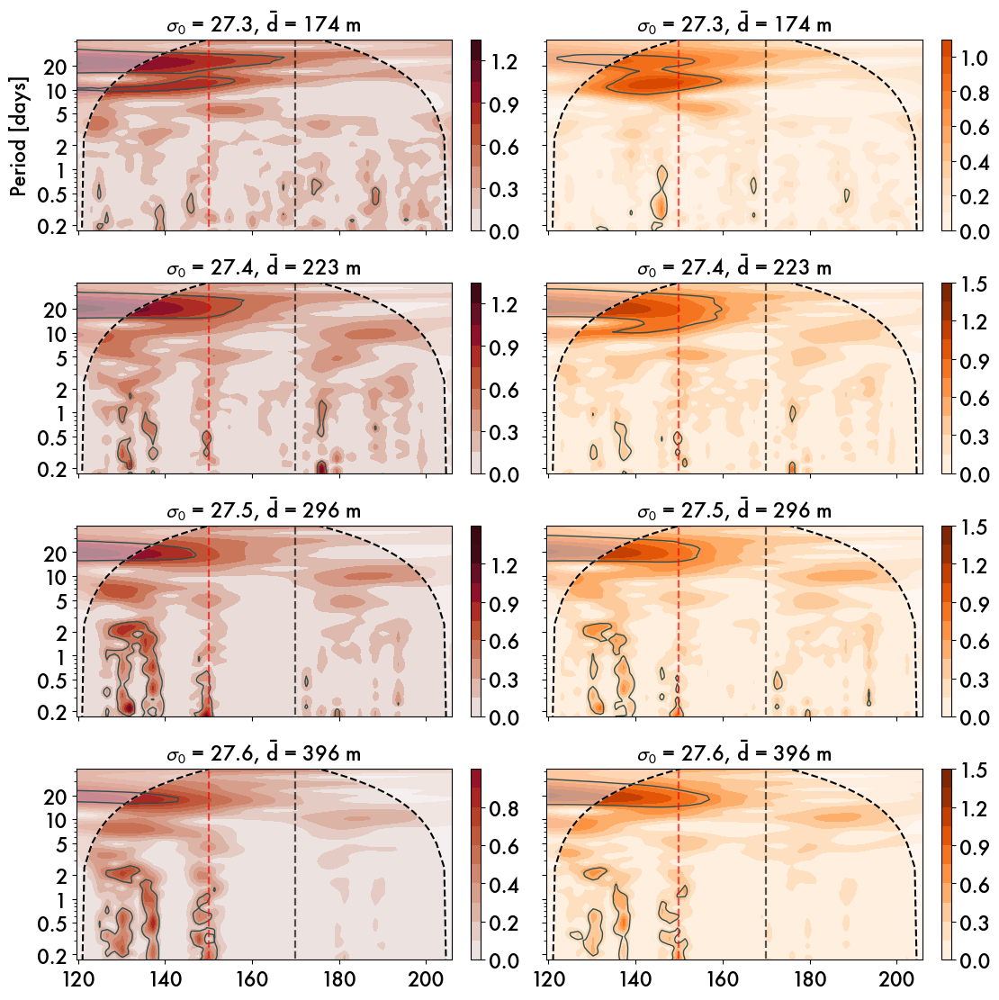

In [29]:
# PAPER FIG: Five nitrate CWTS
fig, axs = plt.subplots(4, 2, figsize=(11,11), sharex=True, sharey=True, layout='constrained')

for ind, sigma in enumerate([27.3, 27.4, 27.5]):
    cwt = nitrate_scal_signif_660[sigma]
    cwt.plot(ax=axs[ind, 0], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.3}, signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1,
             cbar_style={'label':'', 'ticks':[0.0, 0.3, 0.6, 0.9, 1.2]})
    
    
    
    axs[ind,0].set_title(r'$\sigma_0$' + ' = ' + str(sigma) + ', ' + r'$\mathregular{\bar{d}}$' + ' = ' + str(int(d0_660[sigma])) + ' m',
            fontsize=16)
    # axs[ind,0].set_title('')
    axs[ind,0].set_xlabel('')
    axs[ind,0].set_ylabel('')

    axs[ind,0].vlines(150, 0,50, color='r', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)
    axs[ind,0].vlines(170, 0,50, color='k', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)

for sigma in [27.6]:
    ind=3
    cwt = nitrate_scal_signif_660[sigma]
    cwt.plot(ax=axs[ind, 0], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.3}, signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1,
             cbar_style={'label':'', 'ticks':[0.0, 0.2, 0.4, 0.6, 0.8]})
    axs[ind,0].set_title(r'$\sigma_0$' + ' = ' + str(sigma) + ', ' + r'$\mathregular{\bar{d}}$' + ' = ' + str(int(d0_660[sigma])) + ' m',
            fontsize=16)
    # axs[ind,0].set_title('')
    axs[ind,0].set_xlabel('')
    axs[ind,0].set_ylabel('')

    axs[ind,0].vlines(150, 0,50, color='r', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)
    axs[ind,0].vlines(170, 0,50, color='k', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)
# r"$\bf{" + r'$\sigma$' + "}$"


for ind, sigma in enumerate([27.3, 27.4, 27.5, 27.6]):
    cwt = spice_scal_signif_660[sigma]
    cwt.plot(ax=axs[ind, 1], title='', contourf_style={'cmap':'Oranges', 'vmax':1.4}, signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1,
             cbar_style={'label':''})
    axs[ind,1].set_title(r'$\sigma_0$' + ' = ' + str(sigma) + ', ' + r'$\mathregular{\bar{d}}$' + ' = ' + str(int(d0_660[sigma])) + ' m',
            fontsize=16)
    # axs[ind,1].set_title(r'\textbf{A}\boldmath$_\sigma$' + ' = ' + str(sigma) + ', ' + r'$\mathregular{\bar{d}}$' + ' = ' + str(int(d0_660[sigma])) + 'm')
    # axs[ind,1].set_title('')
    axs[ind,1].set_xlabel('')
    axs[ind,1].set_ylabel('')

    axs[ind,1].vlines(150, 0,50, color='r', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)
    axs[ind,1].vlines(170, 0,50, color='k', linewidth=1.6, linestyle='dashed', alpha=0.65, zorder=3)

for r in [0]:
    axs[r,0].set_ylabel('Period [days]')
# for r in [1]:
#     axs[3,r].set_xlabel('Yearday')


        # ax.set_xticklabels(str(sg.ytd2datetime(k))[-5:] for k in xt)
# xt = np.arange(120,210,20)
# axs[3,0].set_xticks(xt)
# axs[3,0].set_xticklabels(['01-May', '21-May', '10-Jun', '30-Jun', '20-Jul'])



100%|██████████| 1/1 [00:00<00:00, 27.97it/s]


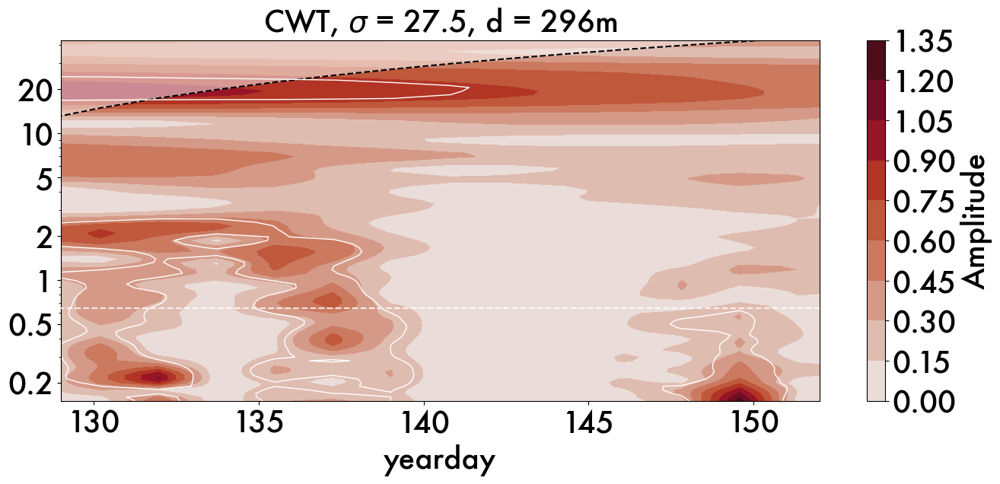

In [218]:
for sigma in tqdm([27.5]):
    scal = nitrate_scal_signif_660[sigma] # _signif
    fig = plt.figure(figsize=(14,7), layout="tight")
    ax=fig.gca()


    tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
    
    scalfig = scal.plot(ax=ax, title='', contourf_style={'cmap':cmo.amp})  # biology: algae for AOU/AOU (oxyAOU)
    ax.set_title(tag)
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('yearday')
    
    # ax.set_ylim([0,5])
    ax.set_xlim([129,152])

    # plt.savefig('../figures/660_isopycnal_scal_sig_' + str(sigma) + '.png', dpi=300)

In [97]:
pd.DataFrame(isosignal_660[27.4])

,yearday,pressure,sigma0,nitrate,spice,oxygen,AOU
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
0,205.512212,219.527938,27.399800,31.548723,-0.346068,263.622142,68.727155
0,205.573934,214.478667,27.398925,31.545587,-0.345852,263.939801,68.357761
0,205.731462,198.982000,27.400116,31.703898,-0.336048,260.700497,71.121240
0,205.792352,199.331400,27.397498,31.577905,-0.340409,262.283624,69.655535


In [100]:
dir = '../working-vars/ML-wavelet/'
for sig in [27.3, 27.4, 27.5, 27.6]: 
    dat = pd.DataFrame(isosignal_660[sig])
    dat.to_csv(dir + 'isosignal660_' + str(int(sig*10)) + '.csv')


100%|██████████| 1/1 [00:00<00:00, 34.27it/s]


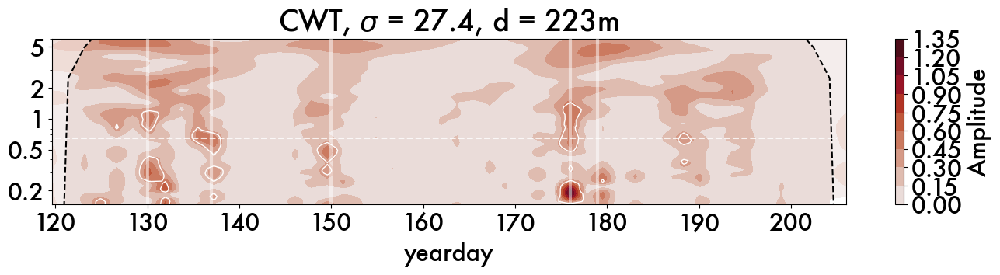

In [273]:
for sigma in tqdm([27.4]):
    
    fig = plt.figure(figsize=(14,4), layout="tight")
    ax=fig.gca()

    scal = nitrate_scal_signif_660[sigma] # _signif
    tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
    
    scalfig = scal.plot(ax=ax, title='', contourf_style={'cmap':cmo.amp})  # biology: algae for AOU/AOU (oxyAOU)
    ax.set_title(tag)
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('yearday')
    ax.set_ylim([0,6])

    # figure: single glider section


for t in [130, 137,150,176, 179]:
    ax.vlines(t, 0, 6, color='w', linewidth=3, alpha=0.9, zorder=3)

# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)
plt.colorbar(sca).set_label('Nitrate (umol/kg)', fontsize=22)

In [286]:

glid_colors = dict.fromkeys(['sg659', 'sg660'])
glid_colors['sg659'] = sns.color_palette('Spectral', 10)[8] #sns.color_palette("PuBuGn")[4]
glid_colors['sg660'] = sns.color_palette("Dark2")[3]


# RERUN

In [36]:
# Save all significance frequency vectors.
dir = '../working-vars/ML-variability/wavelet/'
cwtdat_freq = pd.DataFrame(np.nan, index=np.arange(100), columns=[27.3, 27.4, 27.5, 27.6]) 
cwtdat_freq.loc[0:98, 27.3] = nitrate_scal_signif_660[27.3].frequency
for sigma in [27.4, 27.5, 27.6]:
    cwtdat_freq.loc[:, sigma] = nitrate_scal_signif_660[sigma].frequency
cwtdat_freq.to_csv(dir + 'cwt660_signif_freqvectors.csv', index=True)

# Save spice significance scalograms information
# for sigma in [27.3, 27.4, 27.5, 27.6]:
#     trial = pd.DataFrame(columns=['time', 'amplitude', 'coi', 'signif_amplitude'])
#     trial['time'] = spice_scal_signif_660[sigma].time
#     trial['amplitude'] = spice_scal_signif_660[sigma].amplitude
#     trial['coi'] = spice_scal_signif_660[sigma].coi
#     trial['signif_amplitude'] = spice_scal_signif_660[sigma].signif_qs.scalogram_list[0].amplitude

#     tag = str(sigma).replace('.', '')
#     trial.T.to_csv(dir + 'cwt660_spice_signif_' + tag + '.csv', index=True)
# # 
# Save nitrate significance information
for sigma in [27.3, 27.4, 27.5, 27.6]:
    trial = pd.DataFrame(columns=['time', 'amplitude', 'coi', 'signif_amplitude'])
    trial['time'] = nitrate_scal_signif_660[sigma].time
    trial['amplitude'] = nitrate_scal_signif_660[sigma].amplitude
    trial['coi'] = nitrate_scal_signif_660[sigma].coi
    trial['signif_amplitude'] = nitrate_scal_signif_660[sigma].signif_qs.scalogram_list[0].amplitude

    tag = str(sigma).replace('.', '')
    trial.T.to_csv(dir + 'cwt660_nitrate_signif_' + tag + '.csv', index=True)

In [ ]:
# READ BACK IN
cwtdat_freq = pd.read_csv('../working-vars/glider/cwt660_signif_freqvectors.csv', index=True)
=
# Save spice significance scalograms information
for sigma in [27.3, 27.4, 27.5, 27.6]:
    trial = pd.DataFrame(columns=['time', 'amplitude', 'coi', 'signif_amplitude'])
    trial['time'] = spice_scal_signif_660[sigma].time
    trial['amplitude'] = spice_scal_signif_660[sigma].amplitude
    trial['coi'] = spice_scal_signif_660[sigma].coi
    trial['signif_amplitude'] = spice_scal_signif_660[sigma].signif_qs.scalogram_list[0].amplitude

    tag = str(sigma).replace('.', '')
    trial.T.to_csv('../working-vars/glider/cwt660_spice_signif_' + tag + '.csv', index=True)
# 
# Save nitrate significance information
for sigma in [27.3, 27.4, 27.5, 27.6]:
    trial = pd.DataFrame(columns=['time', 'amplitude', 'coi', 'signif_amplitude'])
    trial['time'] = nitrate_scal_signif_660[sigma].time
    trial['amplitude'] = nitrate_scal_signif_660[sigma].amplitude
    trial['coi'] = nitrate_scal_signif_660[sigma].coi
    trial['signif_amplitude'] = nitrate_scal_signif_660[sigma].signif_qs.scalogram_list[0].amplitude

    tag = str(sigma).replace('.', '')
    trial.T.to_csv('../working-vars/glider/cwt660_nitrate_signif_' + tag + '.csv', index=True)

In [ ]:
# def plot(self, variable = 'amplitude', in_period=True, xlabel=None, ylabel=None, title=None,
#              ylim=None, xlim=None, yticks=None, figsize=[10, 8], mute=False,
#              signif_clr='white', signif_linestyles='-', signif_linewidths=1,
#              contourf_style={}, cbar_style={}, savefig_settings={}, ax=None):
#         '''Plot the scalogram

#         Parameters
#         ----------
#         variable : {'amplitude','power'}
#             Whether to plot the amplitude or power. Default is amplitude
#         in_period : bool, optional
#             Plot the in period instead of frequency space. The default is True.
#         xlabel : str, optional
#             Label for the x-axis. The default is None.
#         ylabel : str, optional
#             Label for the y-axis. The default is None.
#         title : str, optional
#             Title for the figure. The default is None.
#         ylim : list, optional
#             Limits for the y-axis. The default is None.
#         xlim : list, optional
#             Limits for the x-axis. The default is None.
#         yticks : list, optional
#             yticks label. The default is None.
#         figsize : list, optional
#             Figure size The default is [10, 8].
#         mute : bool, optional
#             if True, the plot will not show;
#             recommend to turn on when more modifications are going to be made on ax The default is False.
#             (going to be deprecated)
#         signif_clr : str, optional
#             Color of the singificance line. The default is 'white'.
#         signif_linestyles : str, optional
#             Linestyle of the significance line. The default is '-'.
#         signif_linewidths : float, optional
#             Width for the significance line. The default is 1.
#         contourf_style : dict, optional
#             Arguments for the contour plot. The default is {}.
#         cbar_style : dict, optional
#             Arguments for the colarbar. The default is {}.
#         savefig_settings : dict, optional
#             saving options for the figure. The default is {}.
#         ax : ax, optional
#             Matplotlib Axis on which to return the figure. The default is None.

#         Returns
#         -------
#         fig, ax

#         See also
#         --------

#         pyleoclim.core.ui.Series.wavelet : Wavelet analysis


#         '''
#         contourf_args = {'cmap': 'magma', 'origin': 'lower', 'levels': 11}
#         contourf_args.update(contourf_style)

#         if ax is None:
#             fig, ax = plt.subplots(figsize=figsize)

#         if in_period:
#             y_axis = 1/self.frequency
#             if ylabel is None:
#                 ylabel = f'Period [{self.period_unit}]' if self.period_unit is not None else 'Period'

#             if yticks is None:
#                 yticks_default = np.array([0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 1e4, 2e4, 5e4, 1e5, 2e5, 5e5, 1e6])
#                 mask = (yticks_default >= np.min(y_axis)) & (yticks_default <= np.max(y_axis))
#                 yticks = yticks_default[mask]
#         else:
#             y_axis = self.frequency
#             if ylabel is None:
#                 ylabel = f'Frequency [1/{self.period_unit}]' if self.period_unit is not None else 'Frequency'

#         if variable == 'amplitude':
#             cont = ax.contourf(self.time, y_axis, self.amplitude.T, **contourf_args)
#         elif variable=='power':
#             cont = ax.contourf(self.time, y_axis, self.amplitude.T**2, **contourf_args)
#         else:
#             raise ValueError('Variable should be either "amplitude" or "power"')
#         ax.set_yscale('log')

#         # plot colorbar
#         cbar_args = {'drawedges': False, 'orientation': 'vertical', 'fraction': 0.15, 'pad': 0.05}
#         cbar_args.update(cbar_style)

#         cb = plt.colorbar(cont, **cbar_args)

#         # plot cone of influence
#         if self.coi is not None:
#             ax.plot(self.time, self.coi, 'k--')

#         if yticks is not None:
#             ax.set_yticks(yticks)
#             ax.yaxis.set_major_formatter(ScalarFormatter())
#             ax.yaxis.set_major_formatter(FormatStrFormatter('%g'))

#         if title is not None:
#             ax.set_title(title)

#         if ylim is None:
#             ylim = [np.min(y_axis), np.min([np.max(y_axis), np.max(self.coi)])]

#         ax.fill_between(self.time, self.coi, np.max(self.coi), color='white', alpha=0.5)

#         # plot significance levels
#         if self.signif_qs is not None:
#             signif_method_label = {
#                 'ar1': 'AR(1)',
#             }
#             signif_scal = self.signif_qs.scalogram_list[0]
#             signif_boundary = self.amplitude.T / signif_scal.amplitude.T
#             ax.contour(
#                 self.time, y_axis, signif_boundary, [-99, 1],
#                 colors=signif_clr,
#                 linestyles=signif_linestyles,
#                 linewidths=signif_linewidths,
#             )

#         if xlabel is None:
#             xlabel = self.time_label

#         if xlabel is not None:
#             ax.set_xlabel(xlabel)

#         if ylabel is not None:
#             ax.set_ylabel(ylabel)

#         if xlim is not None:
#             ax.set_xlim(xlim)

#         ax.set_ylim(ylim)

#         if 'fig' in locals():
#             if 'path' in savefig_settings:
#                 plotting.savefig(fig, settings=savefig_settings)
#             # else:
#             #     if not mute:
#             #         plotting.showfig(fig)
#             return fig, ax
#         else:
#             return ax

Text(0, 0.5, 'Pressure [dbar]')

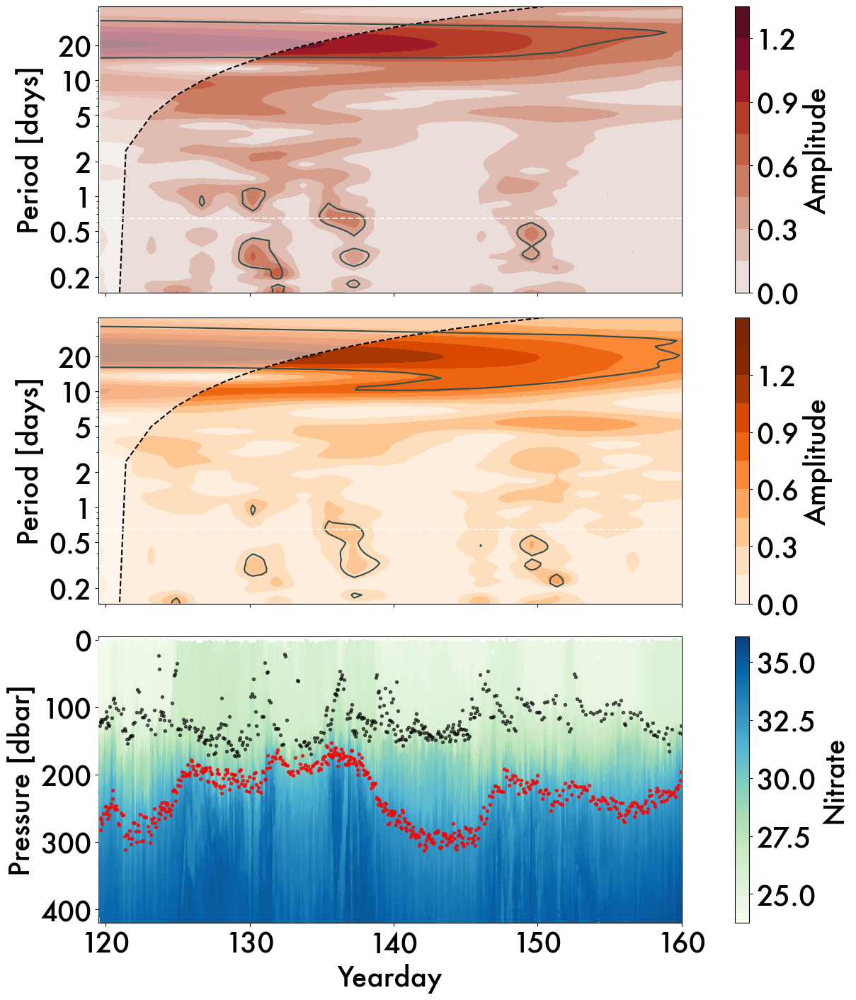

In [200]:
# 3 subplots CWTS: spice, nitrate, nitrate section

days_mark = [130.5, 137, 149.5, 176, 180, 189]

fig, axs = plt.subplots(3, 1, figsize=(12,14), sharex=True, layout='constrained') # 10,12 no labels
axs=axs.flatten()
sigma = 27.4

# plot CWT

nitrate_scal_signif_660[sigma].plot(ax=axs[0], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.4},
            signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1.5, cbar_style={'label':'Amplitude', 'ticks':[0.0, 0.3, 0.6, 0.9, 1.2, 1.5]})


tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
spice_scal_signif_660[sigma].plot(ax=axs[1], title='', contourf_style={'cmap':'Oranges', 'vmax':1.3},  # biology: algae for AOU/AOU (oxyAOU)
            signif_clr='darkslategray', signif_linestyles='-', signif_linewidths=1.5, cbar_style={'label':'Amplitude', 'ticks':[0.0, 0.3, 0.6, 0.9, 1.2]})

for ax in axs[:2]:
    ax.set_title(tag)
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('')
    # ax.set_ylim([0,20])
# axs[0].set_title('spice ' + tag)
# axs[1].set_title('nitrate ' + tag)

# Plot nitrate section
df_glid = df_660[df_660.pressure<420]
sca = axs[2].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate, cmap='GnBu', s=8, zorder=3)
for sigma in [27.4]:
    axs[2].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, c = 'r', s=8, label=sigma, alpha=0.8, zorder=3)


axs[2].scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
axs[2].invert_yaxis()
ylims = [420,-5]
axs[2].set_ylim(ylims)
# axs[2].set_title('')

for ax in axs:
    ax.set_xlim([119.5, 160])
    ax.set_title('')

# for t in days_mark:
#     axs[0].vlines(t, 0,50, color='w', linewidth=4, alpha=0.5, zorder=3)
#     axs[1].vlines(t, 0,50, color='w', linewidth=4, alpha=0.5, zorder=3)
# for t in days_mark:
#     axs[2].vlines(t, ylims[1], ylims[0], color='w', linewidth=4, alpha=0.5, zorder=3)

# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)
plt.colorbar(sca).set_label('Nitrate')

axs[2].set_xlabel('Yearday')
axs[0].set_ylabel('Period [days]')
axs[1].set_ylabel('Period [days]')
axs[2].set_ylabel('Pressure [dbar]')


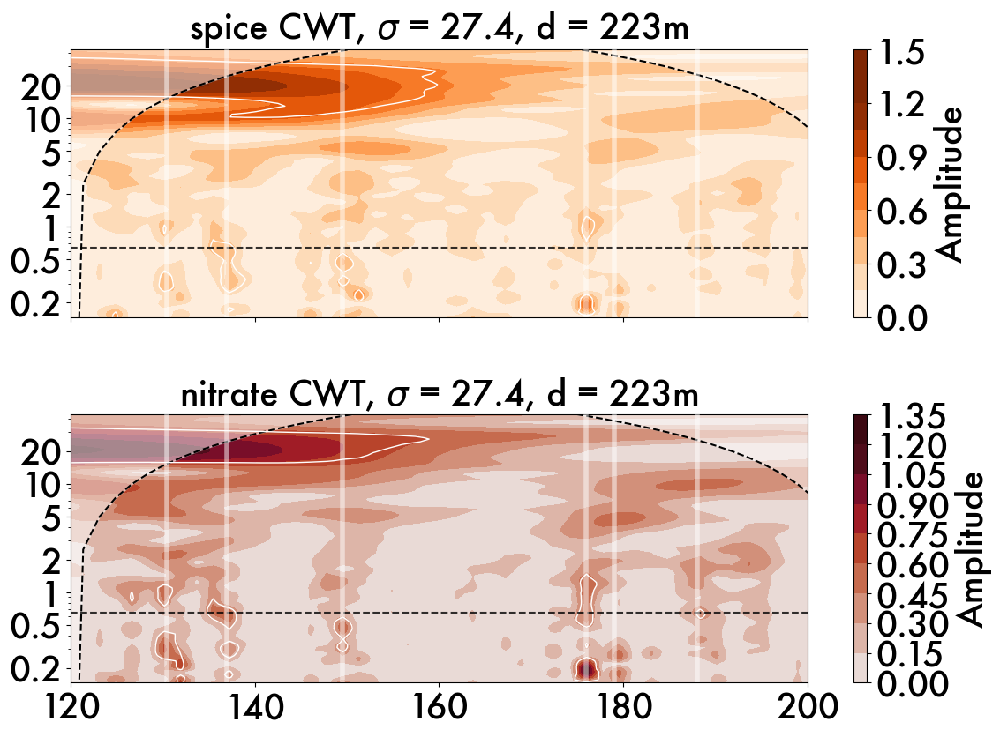

In [214]:
# plot both CWTS, 2 subplots
days_mark = [130.5, 137, 149.5, 176, 179, 188]

fig, axs = plt.subplots(2, 1, figsize=(12,9), sharex=True, layout='tight') # 16,4
axs=axs.flatten()
sigma = 27.4

# plot CWT
tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
spice_scal_signif_660[sigma].plot(ax=axs[0], title='', contourf_style={'cmap':'Oranges', 'vmax':1.2})  # biology: algae for AOU/AOU (oxyAOU)
nitrate_scal_signif_660[sigma].plot(ax=axs[1], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.2})  # biology: algae for AOU/AOU (oxyAOU)

for ax in axs[:2]:
    ax.set_title(tag)
    ax.hlines(0.643, 120, 205, color='k', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('')
    # ax.set_ylim([0,20])
axs[0].set_title('spice ' + tag)
axs[1].set_title('nitrate ' + tag)

for ax in axs:
    ax.set_xlim([120, 200])

for t in days_mark:
    axs[0].vlines(t, 0,50, color='w', linewidth=4, alpha=0.5, zorder=3)
    axs[1].vlines(t, 0,50, color='w', linewidth=4, alpha=0.5, zorder=3)
plt.colorbar(sca).set_label('Nitrate', fontsize=22)

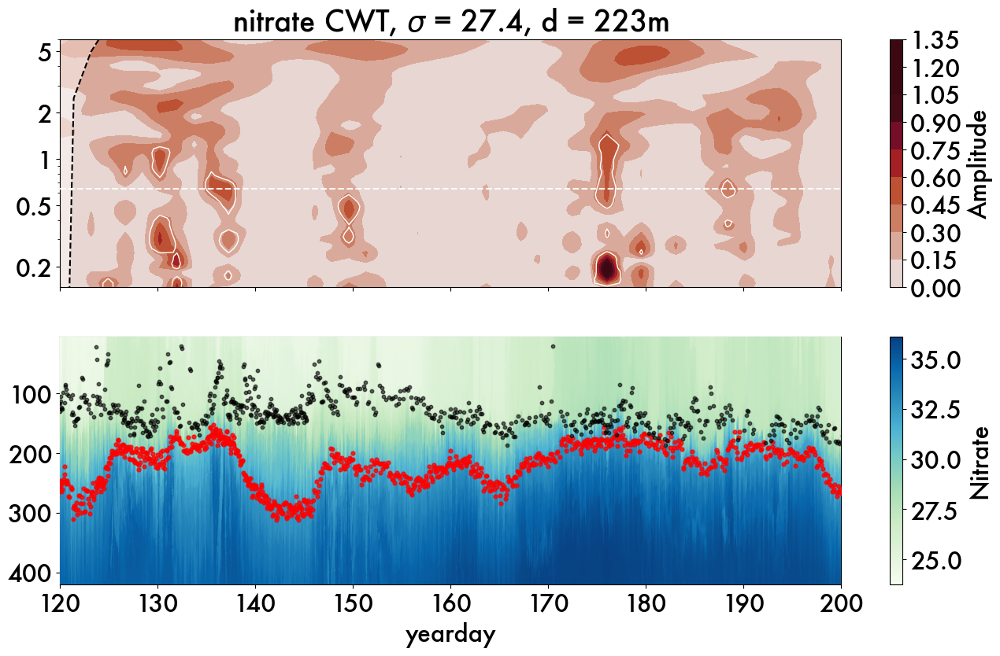

In [471]:
# figure: one CWT, and one nitrate section

days_mark = [130.5, 137, 149.5, 176, 179, 188]

fig, axs = plt.subplots(2, 1, figsize=(16,9), sharex=True) # 16,4
axs=axs.flatten()
sigma=27.4

# plot submesoscale CWT
scal = nitrate_scal_signif_660[sigma] # _signif
tag = 'nitrate CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'

scalfig = scal.plot(ax=axs[0], title='', contourf_style={'cmap':cmo.amp, 'vmax':1})  # biology: algae for AOU/AOU (oxyAOU)
axs[0].set_title(tag)
axs[0].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.9, label='inertial period', zorder=3)
axs[0].set_ylabel('')
axs[0].set_xlabel('')
axs[0].set_ylim([0,6])


# Subplot nitrate section
df_glid = df_660[df_660.pressure<420]
sca = axs[1].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate, cmap='GnBu', s=10, zorder=3)
# Plot mld and isopycnal
for sigma in [27.4]:
    axs[1].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, c = 'r', s=12, label=sigma, alpha=0.8, zorder=3)
axs[1].scatter(dav_660.yearday, dav_660.mld, s=10, c='k', alpha=0.6, zorder=3)
axs[1].invert_yaxis()
ylims = [420,5]
axs[1].set_ylim(ylims)
axs[1].set_xlabel('yearday')

# Mark vertical days
# for t in days_mark:
#     axs[0].vlines(t, 0,6, color='w', linewidth=4, alpha=0.9, zorder=3)
#     axs[1].vlines(t, ylims[1], ylims[0], color='w', linewidth=4, alpha=0.8, zorder=3)

for ax in axs:
    ax.set_xlim([120, 200])

# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)
plt.colorbar(sca).set_label('Nitrate', fontsize=22)

In [284]:
hvariance_660 = pd.read_csv('/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/glider/hvariance_660_split2023.csv')

# Wavelet Transform Coherence

In [53]:
def return_coherence_dict(ave_isopycnal, surfs_1, surfs_2):
    """ 
    @param  surfs_dict: either spice_659 or nitrate_659"""
    coherence_dict = dict.fromkeys(ave_isopycnal)

    for sigma in ave_isopycnal:
        surf_1 = surfs_1[sigma]
        surf_2 = surfs_2[sigma]
        coherence_dict[sigma] = surf_1.wavelet_coherence(surf_2, method='wwz')
    
    return coherence_dict

# coh_659 = return_coherence_dict(ave_isopycnal_659[3:6], spice_659, nitrate_659)
coh_660 = return_coherence_dict(ave_isopycnal_660, spice_660, nitrate_660)

# coherence_scalograms = dict.fromkeys(ave_isopycnal)

# for sigma in tqdm(ave_isopycnal[:]):
#     nit_surf = nitrate_surfs[sigma]
#     spice_surf = spice_surfs[sigma]
#     coherence_scalograms[sigma] = spice_surf.wavelet_coherence(nit_surf, method='wwz') # , settings = {'c':5e-4})

In [54]:

coh_oxynit_660 = return_coherence_dict(ave_isopycnal_660[:], AOU_660, nitrate_660)

In [55]:

coh_oxyspice_660 = return_coherence_dict(ave_isopycnal_660[:], AOU_660, spice_660)

In [253]:
isosignal_660.keys()

dict_keys([27.3, 27.4, 27.5, 27.6, 27.7])

In [131]:
# coh_659 = return_coherence_dict(ave_isopycnal_659[4:8], spice_659, nitrate_659)
# coh_oxynit_659 = return_coherence_dict(ave_isopycnal_659[4:8], AOU_659, nitrate_659)
# coh_oxyspice_659 = return_coherence_dict(ave_isopycnal_659[4:8], AOU_659, spice_659)

In [219]:
sg.list_profile_DFs(df_660)[100]

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate,AOU
65998,82998,125.936582,-51.4019,31.8996,5.044,2.507773,34.06322,329.940662,27.198800,-12.436466,...,-0.866025,0.5,5,6600103,NaN,0.000407,0.000162,0.3599,26.602006,-0.699670
65999,82999,125.936524,-51.4019,31.8996,6.053,2.507773,34.06422,330.030437,27.199595,-12.483076,...,-0.866025,0.5,5,6600103,NaN,0.000407,0.000167,0.3538,26.608841,-0.792038
66000,83009,125.935859,-51.4020,31.8995,16.141,2.507773,34.06222,330.259561,27.198006,-12.483189,...,-0.866025,0.5,5,6600103,NaN,0.000407,0.000157,0.3294,26.595019,-1.016315
66001,83010,125.935772,-51.4020,31.8995,17.150,2.507773,34.06422,330.365378,27.199595,-12.483174,...,-0.866025,0.5,5,6600103,NaN,0.000407,0.000155,0.3477,26.613455,-1.127287
66002,83016,125.935367,-51.4021,31.8995,23.203,2.507773,34.06322,330.055124,27.198800,-12.483266,...,-0.866025,0.5,5,6600103,NaN,0.000419,0.000157,0.3538,26.608358,-0.814648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66624,83912,125.879840,-51.4084,31.8967,929.140,2.018773,34.87722,183.765455,27.886572,-13.807575,...,-0.866025,0.5,5,6600103,NaN,NaN,NaN,NaN,32.029147,147.416117
66625,83913,125.879754,-51.4084,31.8967,930.153,2.017773,34.87722,183.891528,27.886652,-12.155292,...,-0.866025,0.5,5,6600103,NaN,NaN,NaN,NaN,32.032261,147.298342
66626,83914,125.879696,-51.4084,31.8967,931.166,2.015773,34.87822,183.914066,27.887608,-12.255421,...,-0.866025,0.5,5,6600103,NaN,NaN,NaN,NaN,32.023330,147.289815
66627,83915,125.879638,-51.4085,31.8967,932.180,2.015773,34.87822,183.939108,27.887608,-14.498716,...,-0.866025,0.5,5,6600103,NaN,NaN,NaN,NaN,32.025394,147.264776


In [414]:
coh_660

{27.25: <pyleoclim.core.coherence.Coherence at 0x3010f9190>,
 27.28: <pyleoclim.core.coherence.Coherence at 0x30080ec10>,
 27.3: <pyleoclim.core.coherence.Coherence at 0x3020f4790>,
 27.32: <pyleoclim.core.coherence.Coherence at 0x30fc6ad00>,
 27.35: <pyleoclim.core.coherence.Coherence at 0x3008c19a0>,
 27.4: <pyleoclim.core.coherence.Coherence at 0x8c45fb310>,
 27.5: <pyleoclim.core.coherence.Coherence at 0x8c45d71f0>,
 27.6: <pyleoclim.core.coherence.Coherence at 0x88bb01970>,
 27.7: <pyleoclim.core.coherence.Coherence at 0x962d342e0>}

In [415]:
# Add selected isopycnals to existing dictionary
surfs_1 = spice_660
surfs_2 = nitrate_660
for sigma in [27.65]:
        surf_1 = surfs_1[sigma]
        surf_2 = surfs_2[sigma]
        coh_660[sigma] = surf_1.wavelet_coherence(surf_2, method='wwz')

surfs_1 = AOU_660
surfs_2 = nitrate_660
for sigma in [27.65]:
        surf_1 = surfs_1[sigma]
        surf_2 = surfs_2[sigma]
        coh_oxynit_660[sigma] = surf_1.wavelet_coherence(surf_2, method='wwz')

surfs_1 = AOU_660
surfs_2 = nitrate_660
for sigma in [27.65]:
        surf_1 = surfs_1[sigma]
        surf_2 = surfs_2[sigma]
        coh_oxyspice_660[sigma] = surf_1.wavelet_coherence(surf_2, method='wwz')


In [589]:
# LONG -- not the bestm ethod for troubleshooting because of return!!!
def return_coherence_signif(ave_isopycnal, coherence_dict):
    coherence_signif = dict.fromkeys(ave_isopycnal)
    for sigma in tqdm(ave_isopycnal):
        coherence_signif[sigma] = coherence_dict[sigma].signif_test(number=50)

    return coherence_signif


# coh_signif_659 = return_coherence_signif(ave_isopycnal_659[0:7:2], coh_659)
# coh_signif_660 = return_coherence_signif(ave_isopycnal_660[0:7:2], coh_660)

# coherence_scalograms_signif = dict.fromkeys(ave_isopycnal)

# for sigma in tqdm(ave_isopycnal[:]):
#     # Use faster asymptotic version for exploration
#     coherence_scalograms_signif[sigma] = coherence_scalograms[sigma].signif_test(number=50)

100%|██████████| 4/4 [32:12<00:00, 483.21s/it]


In [420]:
for sigma in tqdm([27.65]):
    coh_signif_660[sigma]= coh_660[sigma].signif_test(number=100)

100%|██████████| 1/1 [14:00<00:00, 840.09s/it]


In [57]:
# Better method for trying out significance testing
# coh_oxynit_signif_660 = dict.fromkeys(ave_isopycnal_660)
# coh_oxyspice_signif_660 = dict.fromkeys(ave_isopycnal_660)

# coherence_signif = dict.fromkeys(ave_isopycnal)
for sigma in tqdm(ave_isopycnal_660[1:]):
    coh_oxynit_signif_660[sigma]= coh_oxynit_660[sigma].signif_test(number=100)
    coh_oxyspice_signif_660[sigma]= coh_oxyspice_660[sigma].signif_test(number=100)


100%|██████████| 5/5 [12:06:14<00:00, 8714.84s/it]   


In [238]:
ave_isopycnal_660[:-1]

array([27.3, 27.4, 27.5, 27.6])

In [395]:
coh_signif_660

{27.25: <pyleoclim.core.coherence.Coherence at 0x30fc97340>,
 27.28: <pyleoclim.core.coherence.Coherence at 0x3082f6790>,
 27.3: <pyleoclim.core.coherence.Coherence at 0x33d83bcd0>,
 27.32: <pyleoclim.core.coherence.Coherence at 0x3ae478640>,
 27.35: <pyleoclim.core.coherence.Coherence at 0x30ed60790>,
 27.4: <pyleoclim.core.coherence.Coherence at 0x9c854fbe0>,
 27.5: <pyleoclim.core.coherence.Coherence at 0x915a3dd60>,
 27.6: <pyleoclim.core.coherence.Coherence at 0x67416c250>,
 27.7: <pyleoclim.core.coherence.Coherence at 0x8c47d71f0>}

Text(0.5, 0, 'yearday')

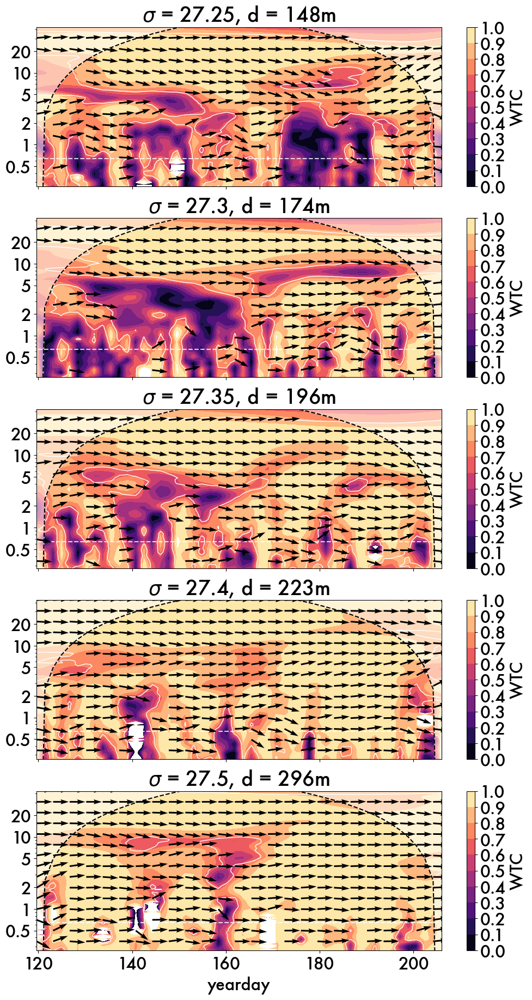

In [388]:
glidname = 'sg660'
# figtitle = glidname + ', along-iso nitrate wavelet'
fig, axs = plt.subplots(5,1, figsize=(12, 22), sharex=True)
axs = axs.flatten()

for ind, sigma in enumerate([27.25, 27.3, 27.35, 27.4, 27.5]):
    coh = coh_signif_660[sigma]
    sca = coh.plot(ax=axs[ind], title='', contourf_style={'cmap':'magma'}, 
                                phase_style = {'skip_x':2, 'skip_y':6, 'width':.004, 'scale':26})
    axs[ind].set_title(r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

axs[4].set_xlabel('yearday')
# fig.colorbar(sca, ax=axs[0:4], shrink=0.8).set_label('coherence', fontsize=20)

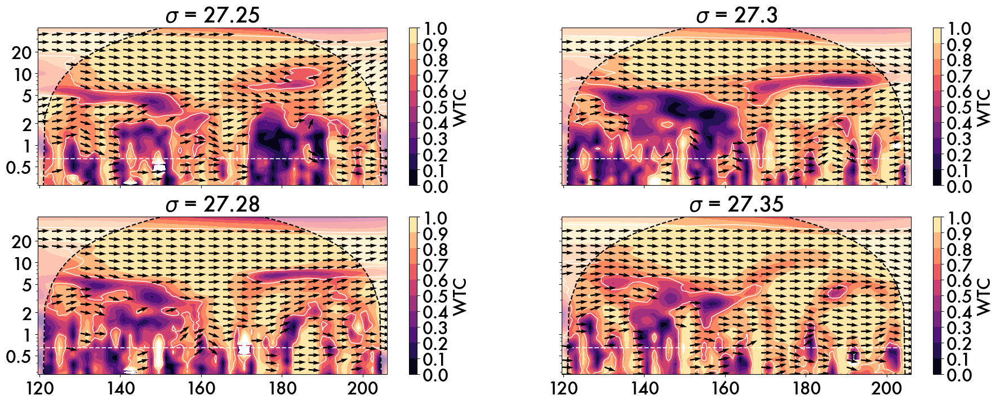

In [62]:
glidname = 'sg660'
# figtitle = glidname + ', along-iso nitrate wavelet'
fig, axs = plt.subplots(2,2, figsize=(22, 8), sharex=True, sharey=True)
# axs = axs.flatten()

ave_isopycnal_660[0:7:2]

for ind, sigma in enumerate([27.25, 27.28]):
    coh = coh_signif_660[sigma]
    coh.plot(ax=axs[ind, 0])
    axs[ind,0].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ind, sigma in enumerate([27.3, 27.35]):
    coh = coh_signif_660[sigma]
    coh.plot(ax=axs[ind, 1])
    axs[ind,1].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

# plt.title(figtitle)

In [423]:
d0_660

{27.25: 148.35,
 27.3: 174.63,
 27.35: 196.59,
 27.4: 223.68,
 27.5: 296.8,
 27.6: 396.92,
 27.65: 460.03,
 27.7: 537.05}

In [424]:
d0_660[27.28] = 165
d0_660[27.32] = 183


In [421]:
coh_signif_660

{27.25: <pyleoclim.core.coherence.Coherence at 0x30fc97340>,
 27.28: <pyleoclim.core.coherence.Coherence at 0x3082f6790>,
 27.3: <pyleoclim.core.coherence.Coherence at 0x33d83bcd0>,
 27.32: <pyleoclim.core.coherence.Coherence at 0x3ae478640>,
 27.35: <pyleoclim.core.coherence.Coherence at 0x30ed60790>,
 27.4: <pyleoclim.core.coherence.Coherence at 0x9c854fbe0>,
 27.5: <pyleoclim.core.coherence.Coherence at 0x915a3dd60>,
 27.6: <pyleoclim.core.coherence.Coherence at 0x67416c250>,
 27.7: <pyleoclim.core.coherence.Coherence at 0x8c47d71f0>,
 27.65: <pyleoclim.core.coherence.Coherence at 0xabc2d1d60>}

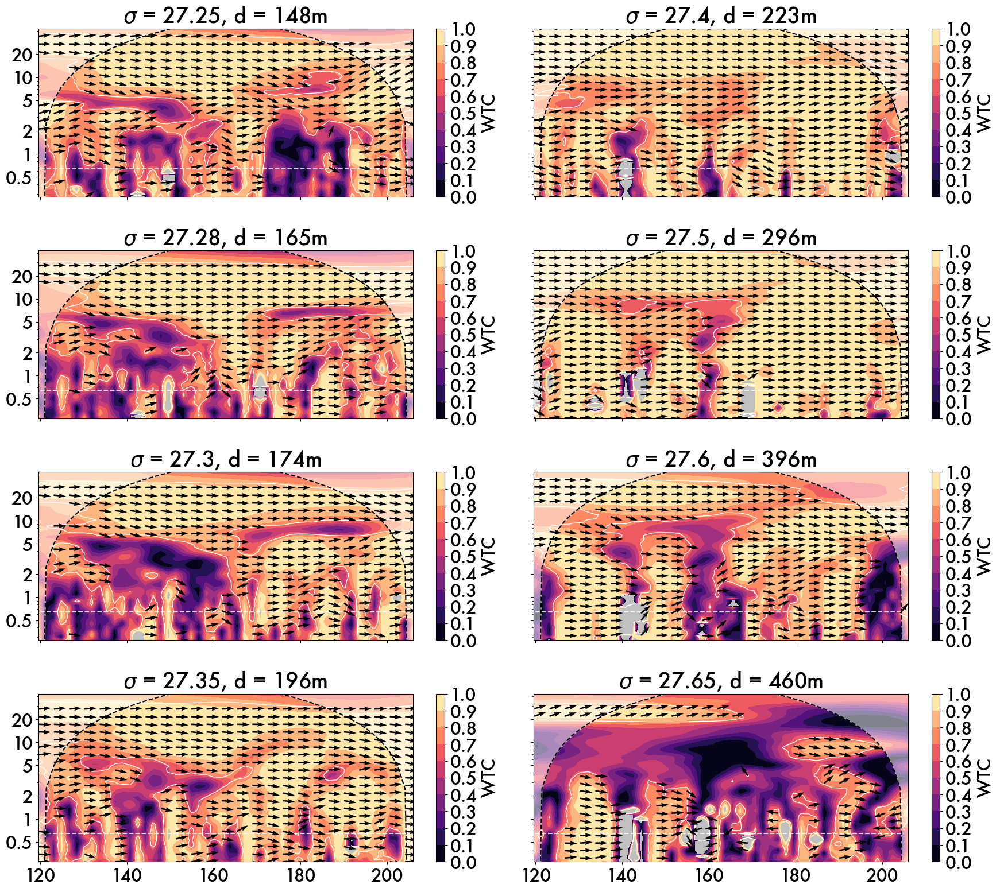

In [430]:


fig, axs = plt.subplots(4,2, figsize=(18, 16), sharex=True, sharey=True, layout='tight')
# axs = axs.flatten()

for ind, sigma in enumerate([27.25, 27.28, 27.3, 27.35]):
    coh = coh_signif_660[sigma]
    coh.plot(ax=axs[ind, 0])
    axs[ind,0].set_title(r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

for ind, sigma in enumerate([27.4, 27.5, 27.6, 27.65]):
    coh = coh_signif_660[sigma]
    coh.plot(ax=axs[ind, 1])
    axs[ind,1].set_title(r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('silver')


In [649]:
plt.style.use('default')

KeyError: 27.1

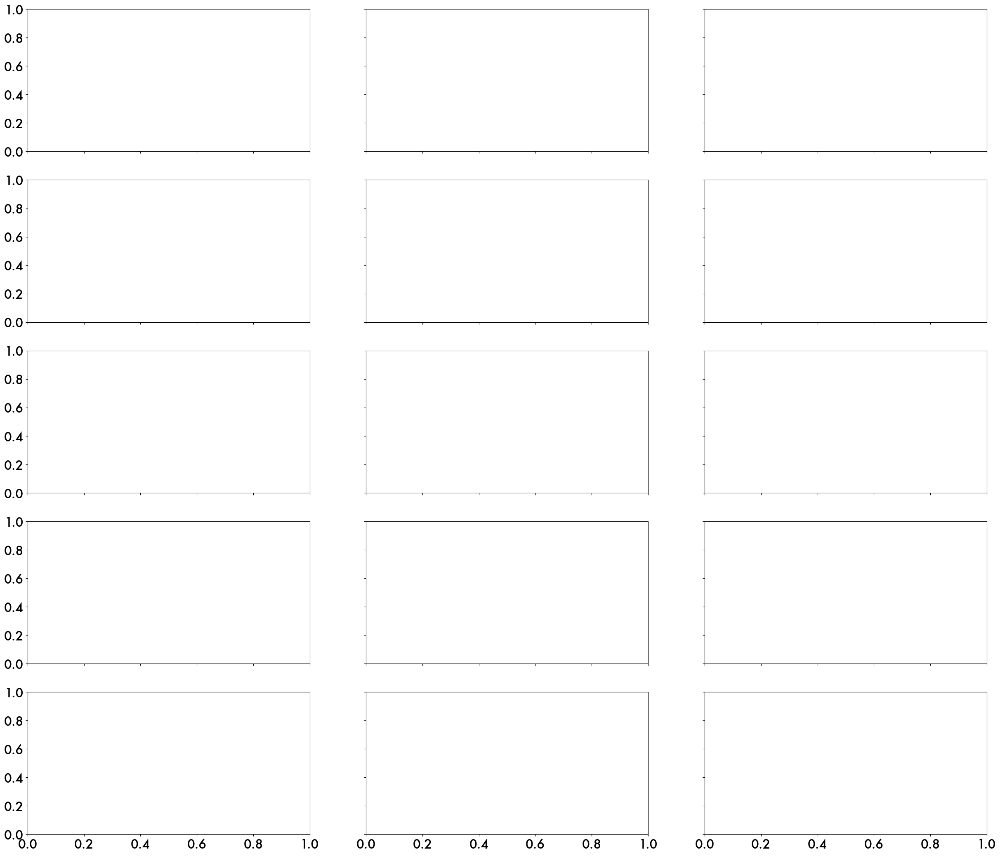

In [67]:
glidname = 'sg660'
ave_isopycnal = ave_isopycnal_660


figtitle = glidname + ', along-iso nitrate wavelet'
fig, axs = plt.subplots(5,3, figsize=(30, 26), sharex=True, sharey=True)
# axs = axs.flatten()

for ind, sigma in enumerate(ave_isopycnal[0:5]):
    coh = coh_oxyspice_660[sigma]
    coh.plot(ax=axs[ind, 0])
    axs[ind,0].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ind, sigma in enumerate(ave_isopycnal[5:10]):
    coh = coh_oxyspice_660[sigma]
    coh.plot(ax=axs[ind, 1])
    axs[ind,1].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ind, sigma in enumerate(ave_isopycnal[10:]):
    coh = coh_oxyspice_660[sigma]
    coh.plot(ax=axs[ind, 2])
    axs[ind,2].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

# plt.colorbar().remove()

# plt.title(figtitle)

In [298]:
size = 22
params = {'legend.fontsize': size-4, 
          'xtick.labelsize':size, 
          'ytick.labelsize':size, 
          'font.size':size,
          'font.family':'Futura'}
plt.rcParams.update(params)

In [293]:
ave_isopycnal_660 = [27.25, 27.3, 27.4, 27.5, 27.6, 27.7]

100%|██████████| 1/1 [00:00<00:00, 22.21it/s]


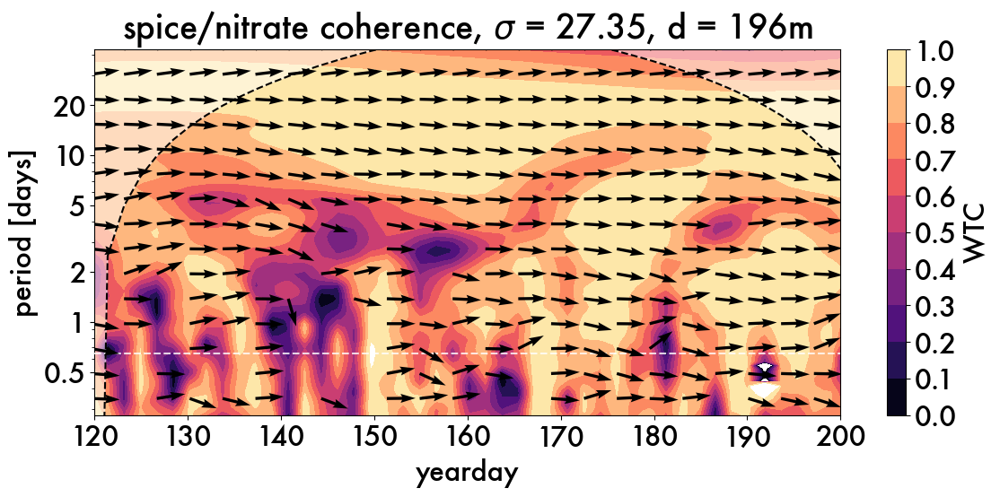

In [472]:
# full coherence plots
for sigma in tqdm([27.35]):
    # coh = coh_oxynit_660[sigma] # 
    fig = plt.figure(figsize=(12,6), layout="tight")
    ax=fig.gca()

    tag = 'spice/nitrate coherence, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'

    cohfig = coh_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'magma'}, 
                                phase_style = {'skip_x':2, 'skip_y':6, 'width':.004, 'scale':26}) # default Magma for spicerate/spice ()

    # cohfig = coh_oxynit_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'YlGnBu_r'}) 
    # cohfig = coh_oxyspice_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':cmo.ice}) 


    ax.set_title(tag)
    # ax.set_title('')

    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    # ax.set_ylim([0,6])
    ax.set_xlim([120,200])
    ax.set_xlabel('yearday')
    ax.set_ylabel('period [days]')

    # plt.savefig('../figures/660_isopycnal_coh_sig_' + str(sigma) + '.png', dpi=300)

In [ ]:
d0_660 = print_horizons()

In [70]:
coh_signif_660

{27.25: <pyleoclim.core.coherence.Coherence at 0x30fc97340>,
 27.28: <pyleoclim.core.coherence.Coherence at 0x3082f6790>,
 27.3: <pyleoclim.core.coherence.Coherence at 0x33d83bcd0>,
 27.32: <pyleoclim.core.coherence.Coherence at 0x3ae478640>,
 27.35: <pyleoclim.core.coherence.Coherence at 0x30ed60790>}

100%|██████████| 1/1 [00:00<00:00, 35.06it/s]


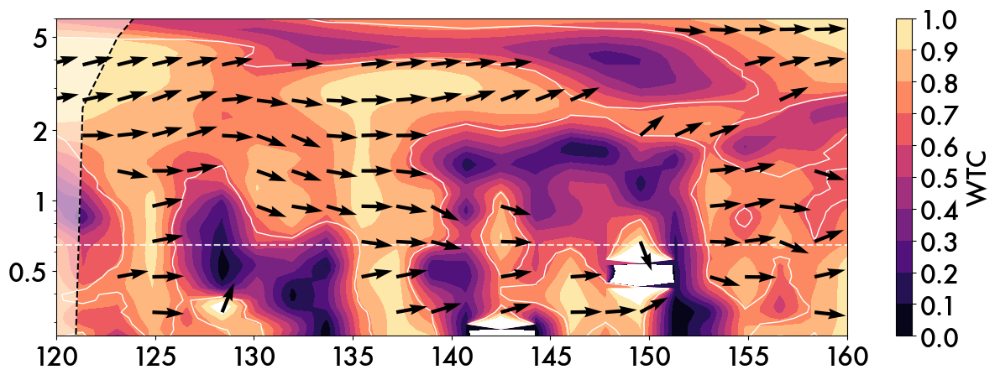

In [93]:
# Main coherence plots
for sigma in tqdm([27.25]):
    coh = coh_signif_660[sigma] # _signif

    fig = plt.figure(figsize=(13,5), layout="tight")
    ax=fig.gca()

    tag = 'nitrate/spice coherence, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
    phase_args = {'skip_x':1, 'skip_y':6, 'width':.0045, 'scale':25}
    # contour_args = {'cmap':'magma'}

    cohfig = coh_signif_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'magma'}, phase_style = phase_args) # default Magma for spicerate/spice ()
    # cohfig = coh_oxynit_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'YlGnBu_r'}, phase_style = phase_args)
    # cohfig = coh_oxyspice_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':cmo.ice}, phase_style = phase_args)


    ax.set_title(tag)
    ax.set_ylabel('period [days]')

    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylim([0,6])
    ax.set_xlim([120,160])
    

    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title('')

    # plt.savefig('../figures/660_isopycnal_coh_sig_' + str(sigma) + '.png', dpi=300)

In [447]:
d0_660

{27.25: 148.35,
 27.3: 174.63,
 27.35: 196.59,
 27.4: 223.68,
 27.5: 296.8,
 27.6: 396.92,
 27.65: 460.03,
 27.7: 537.05,
 27.28: 165,
 27.32: 183}

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 12.45it/s]


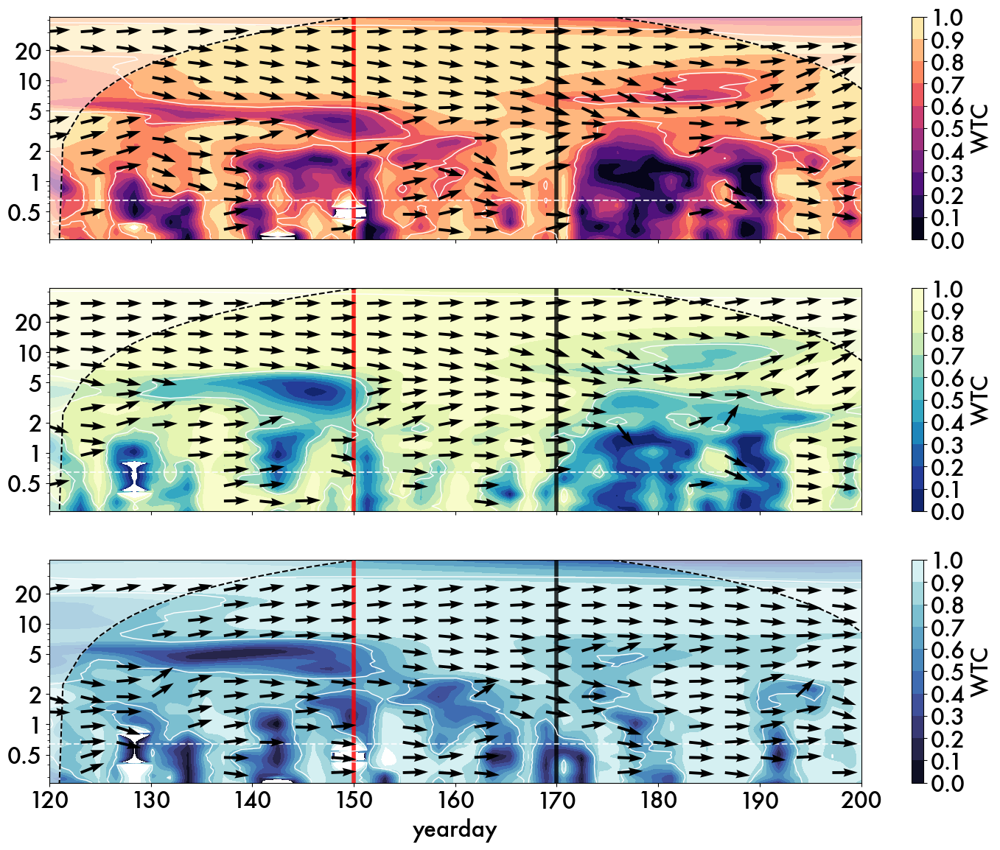

In [449]:
# Compare TWO oxygen wavelet coherence

# fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)
# axs = axs.flatten()

for sigma in tqdm(ave_isopycnal_660[:1]):
    fig, axs = plt.subplots(3, 1, figsize=(15, 12), sharex=True, layout='tight')
    axs = axs.flatten()

    tag = 'spice/nitrate coherence, ' + r'$\sigma$' + ' = ' + str(sigma)

    phase_args = {'skip_x':2, 'skip_y':6, 'width':.0035, 'scale':32}
    coh_signif_660[sigma].plot(ax=axs[0], title=tag, phase_style = phase_args) 
    coh_oxynit_signif_660[sigma].plot(ax=axs[1], title=tag, contourf_style={'cmap':'YlGnBu_r'}, phase_style = phase_args)  
    coh_oxyspice_signif_660[sigma].plot(ax=axs[2], title=tag, contourf_style={'cmap':cmo.ice}, phase_style = phase_args)  
    # ax.set_title(tag)

    for ax in axs:
        ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
        # ax.set_ylim([0,5])
        ax.set_xlim([120,200])
        # ax.set_ylim([0.2, 10])
        ax.set_title('')
        ax.set_ylabel('')
        ax.set_xlabel('yearday')

    for ax in axs[:2]:
        ax.set_xlabel('')
    for ax in axs:
        ax.vlines(150, -20,250, color='r', linewidth=4, alpha=0.8, zorder=1)
        ax.vlines(170, -20,250, color='k', linewidth=4, alpha=0.8, zorder=1)


    # axs[0].set_title('spice/nitrate coherence, '+ r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')
    # axs[1].set_title('oxygen/nitrate coherence, '+ r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')
    # axs[2].set_title('oxygen/spice coherence, '+ r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm')

    # plt.savefig('../figures/660_isopycnal_coh_sig_' + str(sigma) + '.png', dpi=300)

Text(0.5, 1.0, 'along-isopycnal')

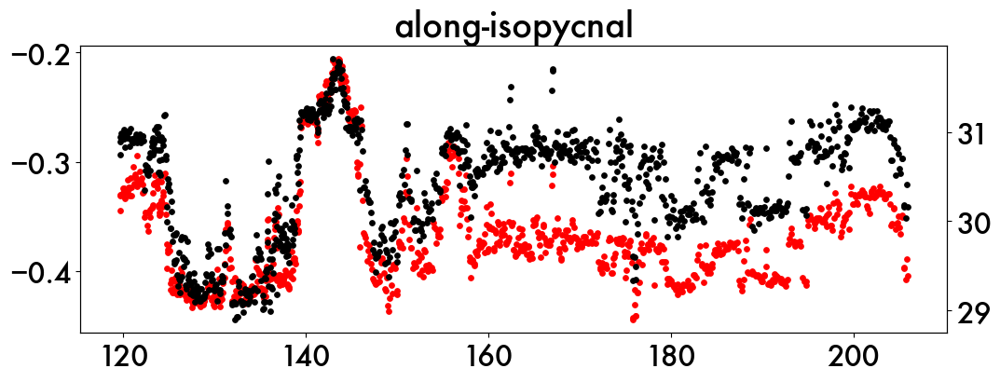

In [204]:
fig = plt.figure(figsize=(12,4))
ax = fig.gca()


# ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].spice, s=15, c = 'r', label='spice', zorder=3)
# ax.set_ylabel('spice')


# twax = ax.twinx()
# twax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].nitrate, s=15, c = 'k', label='nitrate', zorder=3)
# twax.set_ylabel('nitrate')

# ax.grid()


ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].spice, s=15, c = 'r', label='spice', zorder=3)
twax = ax.twinx()
twax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].nitrate, s=15, c = 'k', label='nitrate', zorder=3)
# twax.invert_yaxis()
ax.set_title('along-isopycnal')


# ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
# ax.scatter(isosignal_660[27.25].yearday, isosignal_660[27.25].pressure, 
#             c = 'r', s=8, label=sigma, alpha=0.8, zorder=3)

(120.0, 200.0)

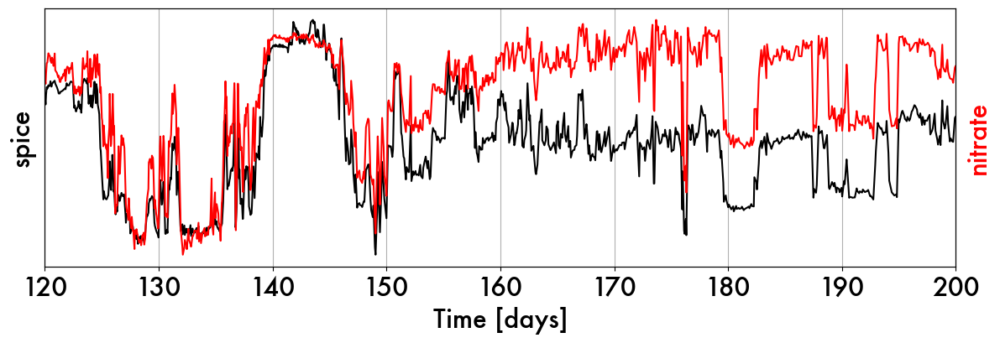

In [226]:
fig = plt.figure(figsize=(14,4))
ax = fig.gca()
twax = ax.twinx()

spice_660[27.4].plot(ax=ax, color='k', label='spice')
nitrate_660[27.4].plot(ax=twax, color='r', label='nitrate')

ax.set_ylabel('spice', color='k')
ax.set_yticks([])
twax.set_ylabel('nitrate', color='r')
twax.set_yticks([])

twax.get_legend().remove()
ax.get_legend().remove()
ax.grid(axis='x', which='both')
ax.grid(axis='x', which='minor')
ax.set_xlim([120, 200])
# ax.legend(loc='upper left', framealpha=0)

Text(0.5, 0, 'yearday')

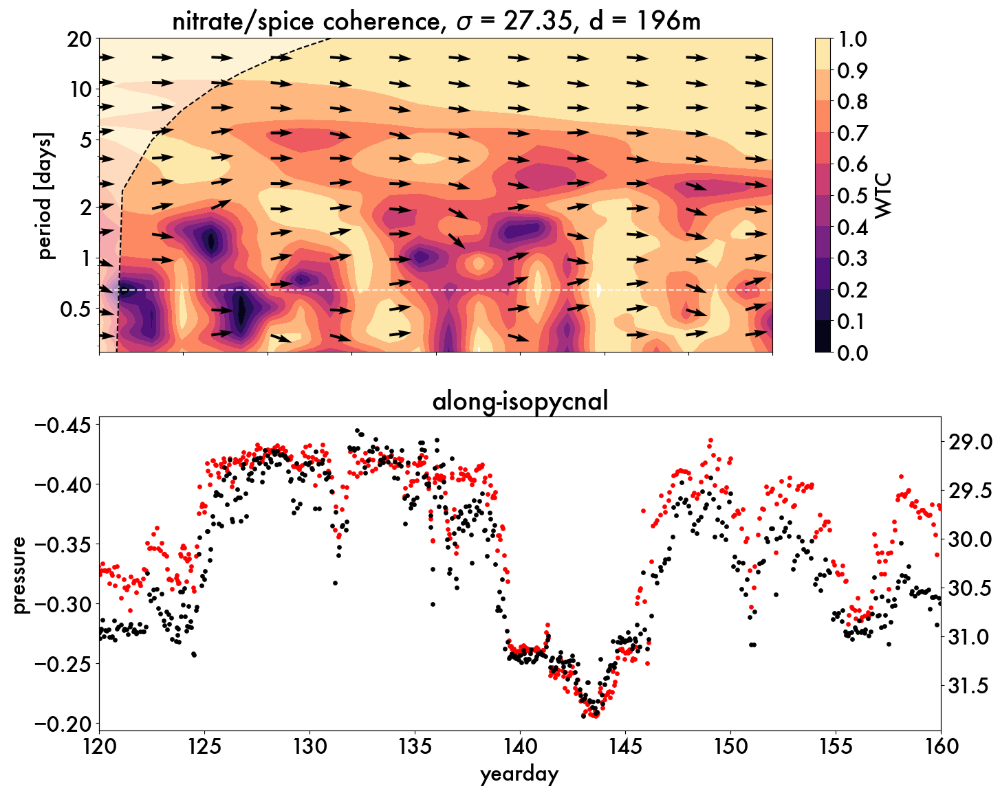

In [160]:
# PRESENTATION FIG -- only two: comparing glider nitrate
sigma = 27.35
depth = 420

minday = 120
maxday = 160


fig, axs = plt.subplots(2, 1, figsize=(15, 12), sharex=True, layout='tight')
axs = axs.flatten()
tag = 'nitrate/spice coherence, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'

cohfig = coh_660[sigma].plot(ax=axs[0], title=tag, contourf_style={'cmap':'magma'}, 
                             phase_style = {'skip_x':2, 'skip_y':6, 'width':.004, 'scale':30}) # default Magma for spicerate/spice ()

# cohfig = coh_oxynit_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'YlGnBu_r'}) 
# cohfig = coh_oxyspice_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':cmo.ice}) 


df_glid = df_660[df_660.pressure<depth]
df_glid = df_glid[(df_glid.yearday>minday) & (df_glid.yearday<maxday)]


axs[1].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].spice, s=15, c = 'r', label='spice', zorder=3)
twax = axs[1].twinx()
twax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].nitrate, s=15, c = 'k', label='nitrate', zorder=3)
twax.invert_yaxis()
axs[1].set_title('along-isopycnal')


# plt.legend(fontsize=20, markerscale =2, loc="lower right", facecolor='w', framealpha=0.9)


for ax in axs[1:]:
    ax.set_xlim([minday, maxday])
    ax.invert_yaxis()
    # ax.set_ylim([depth+5,15])
    ax.set_ylabel('pressure')


# plt.colorbar(sca2, shrink=0.8).set_label(r'$ \tau $', fontsize=22)
plt.colorbar(sca1, shrink=0.8).set_label('nitrate', fontsize=22)

axs[0].set_title(tag)
axs[0].set_xlabel('')
axs[0].set_ylabel('period [days]')
axs[0].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
axs[0].set_ylim([0,20])

axs[1].set_xlabel('yearday')

In [368]:
spice_scal_signif_660

{27.3: None,
 27.4: None,
 27.5: None,
 27.6: None,
 27.7: None,
 27.25: <pyleoclim.core.scalograms.Scalogram at 0x9b0ef6610>,
 27.35: <pyleoclim.core.scalograms.Scalogram at 0x9cb8458b0>}

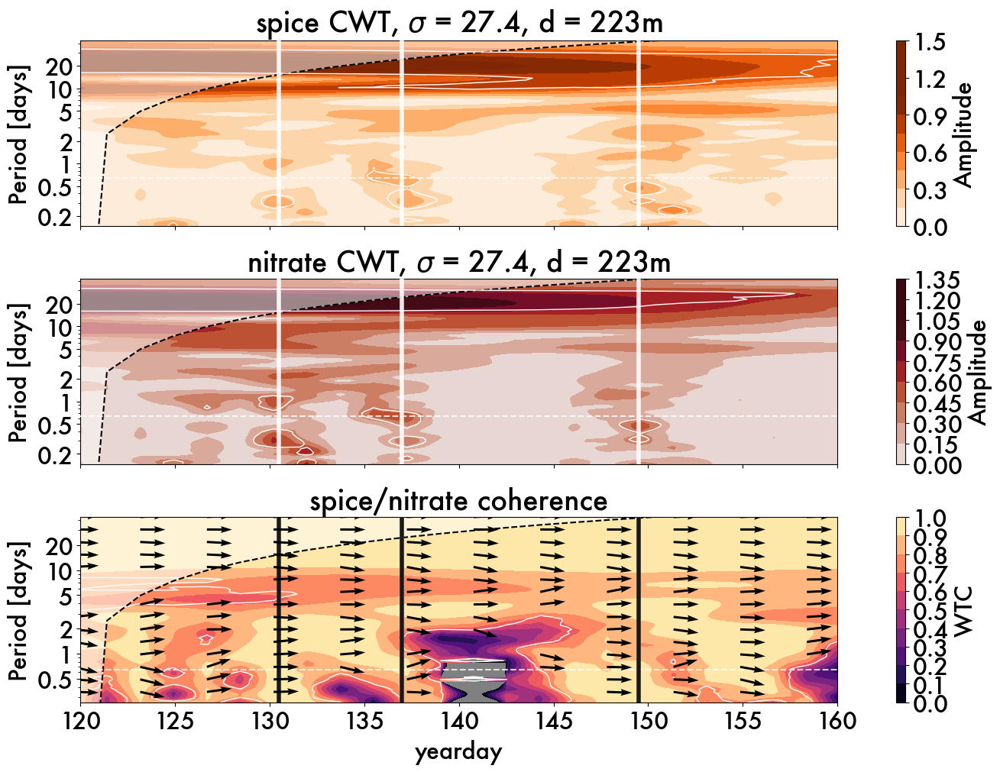

In [480]:
# Paper fig: 
days_mark = [130.5, 137, 149.5, 176, 180, 189]

fig, axs = plt.subplots(3, 1, figsize=(13,10), sharex=True, layout='constrained') # 16,12
axs=axs.flatten()
sigma = 27.4

# plot CWT
tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
spice_scal_signif_660[sigma].plot(ax=axs[0], title='', contourf_style={'cmap':'Oranges', 'vmax':1})  # biology: algae for AOU/AOU (oxyAOU)
nitrate_scal_signif_660[sigma].plot(ax=axs[1], title='', contourf_style={'cmap':cmo.amp, 'vmax':1})  # biology: algae for AOU/AOU (oxyAOU)


# Plot coherence
cohfig = coh_signif_660[sigma].plot(ax=axs[2], title=tag, contourf_style={'cmap':'magma'}, 
                                phase_style = {'skip_x':2, 'skip_y':6, 'width':.003, 'scale':30})
axs[2].set_title('')


# For top three panels
for ax in axs[:3]:
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('')
    for t in days_mark:
        ax.vlines(t, 0,50, color='w', linewidth=4, alpha=0.9, zorder=3)
for t in days_mark:
    axs[2].vlines(t, 0,50, color='k', linewidth=4, alpha=0.9, zorder=3)

# set titles on or off
axs[0].set_title('spice ' + tag)
axs[1].set_title('nitrate ' + tag)
axs[2].set_title('spice/nitrate coherence')

for ax in axs:
    ax.set_xlim([120, 160])
    ax.set_ylabel('Period [days]')
    # ax.set_ylim([0,6])

axs[-1].set_xlabel('yearday')
axs[-1].set_facecolor('grey')
# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)


NameError: name 'spice_scal_signif_660' is not defined

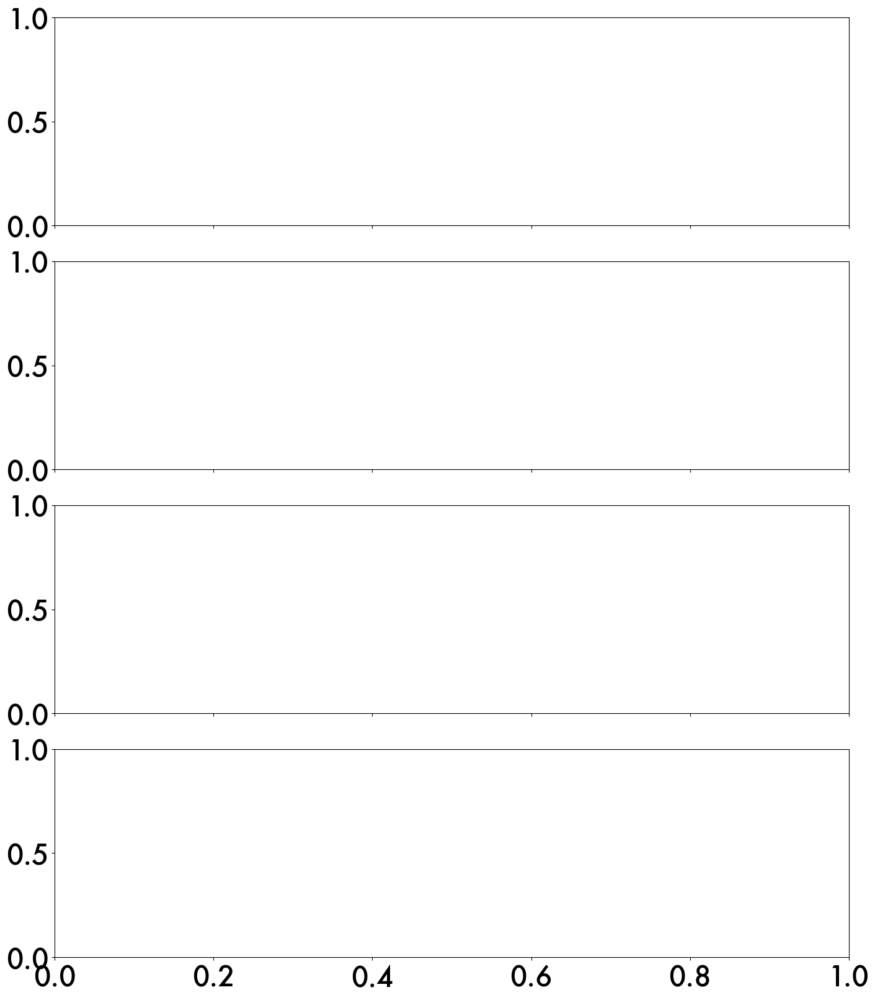

In [11]:
# Paper fig: 
days_mark = [130.5, 137, 149.5, 176, 180, 189]

fig, axs = plt.subplots(4, 1, figsize=(14,16), sharex=True, layout='constrained') # 16,4
axs=axs.flatten()
sigma = 27.4

# plot CWT
tag = 'CWT, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'
spice_scal_signif_660[sigma].plot(ax=axs[0], title='', contourf_style={'cmap':'Oranges', 'vmax':1.2})  # biology: algae for AOU/AOU (oxyAOU)
nitrate_scal_signif_660[sigma].plot(ax=axs[1], title='', contourf_style={'cmap':cmo.amp, 'vmax':1.2})  # biology: algae for AOU/AOU (oxyAOU)


    # ax.set_ylim([0,20])

# Plot coherence
tag = 'spice/nitrate coherence, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'

cohfig = coh_signif_660[sigma].plot(ax=axs[2], title=tag, contourf_style={'cmap':'magma'}, 
                                phase_style = {'skip_x':1, 'skip_y':6, 'width':.003, 'scale':30})
axs[2].set_title('')


# For top three panels
for ax in axs[:3]:
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_ylabel('')
    ax.set_xlabel('')
    for t in days_mark:
        ax.vlines(t, 0,50, color='w', linewidth=4, alpha=0.9, zorder=3)
for t in days_mark:
    axs[2].vlines(t, 0,50, color='k', linewidth=4, alpha=0.9, zorder=3)


# Plot nitrate section
df_glid = df_660[df_660.pressure<420]
sca = axs[3].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate, cmap=cmo.deep, s=10, zorder=3, vmin=23.9, vmax=35.9)
plt.colorbar(sca).set_label('Nitrate', fontsize=22)


axs[3].scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, c = 'r', s=12, label=sigma, alpha=0.8, zorder=3)
axs[3].scatter(dav_660.yearday, dav_660.mld, s=10, c='k', alpha=0.6, zorder=3)
axs[3].invert_yaxis()
ylims = [420,5]
axs[3].set_ylim(ylims)


for t in days_mark:
    axs[3].vlines(t, ylims[1], ylims[0], color='w', linewidth=4, alpha=0.9, zorder=3)

# set titles on or off
# axs[0].set_title('spice ' + tag)
# axs[1].set_title('nitrate ' + tag)
# axs[2].set_title('spice/nitrate coherence')
# axs[3].set_title('sg660 section')

# for ax in axs:
#     ax.set_xlim([120, 200])

for ax in axs:
    ax.set_xlim([120, 160])
    ax.set_ylabel('Period [days]')
    # ax.set_ylim([0,6])

axs[-1].set_xlabel('Yearday')
axs[-2].set_facecolor('grey')



# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)


Text(0.5, 0, 'yearday')

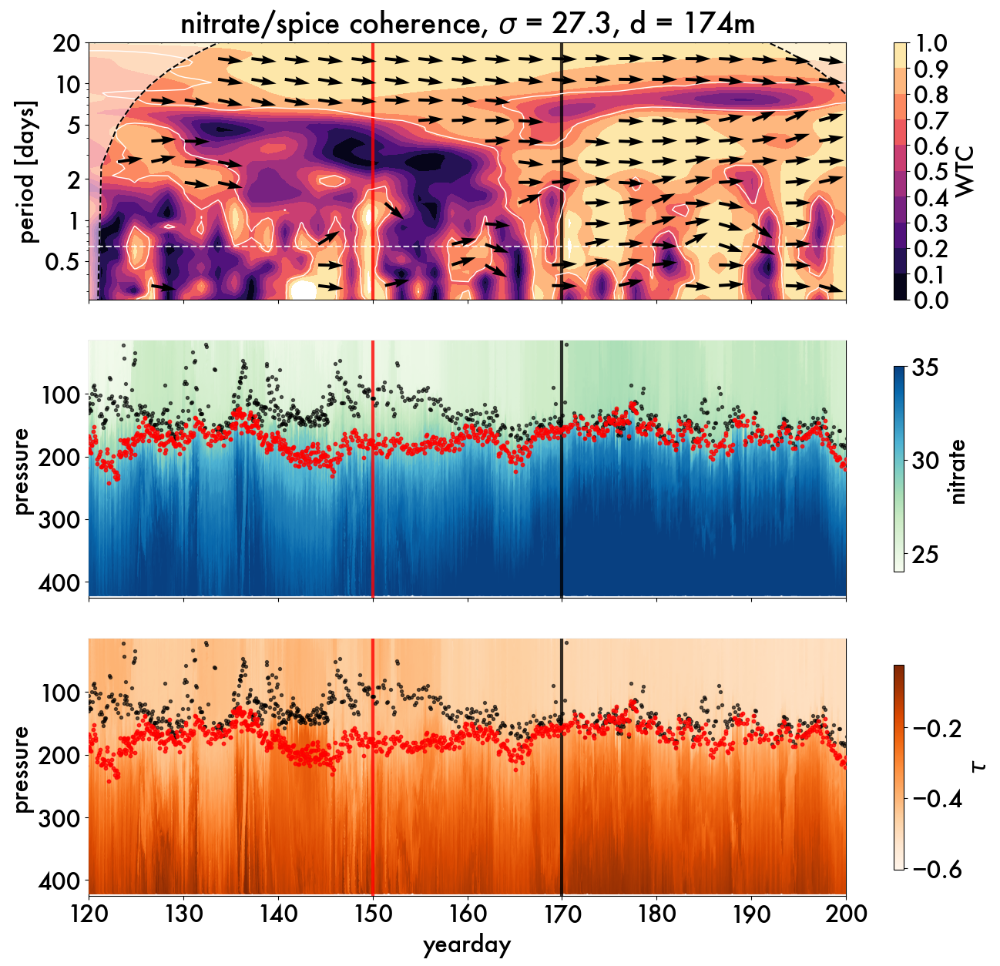

In [469]:
# PAPER FIG: comparing glider nitrate and spice sections to the coherence at 27.25
sigma = 27.3
depth = 420

minday = 120
maxday = 200


fig, axs = plt.subplots(3, 1, figsize=(14, 13), sharex=True, layout='tight')
axs = axs.flatten()
tag = 'nitrate/spice coherence, ' + r'$\sigma$' + ' = ' + str(sigma) + ', d = ' + str(int(d0_660[sigma])) + 'm'

cohfig = coh_signif_660[sigma].plot(ax=axs[0], title=tag, contourf_style={'cmap':'magma'}, 
                             phase_style = {'skip_x':2, 'skip_y':6, 'width':.004, 'scale':30}) # default Magma for spicerate/spice ()
                            # phase_style = {'skip_x':1, 'skip_y':6, 'width':.005, 'scale':20})  # for yearday to one60
# cohfig = coh_oxynit_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':'YlGnBu_r'}) 
# cohfig = coh_oxyspice_660[sigma].plot(ax=ax, title=tag, contourf_style={'cmap':cmo.ice}) 


df_glid = df_660[df_660.pressure<depth]
df_glid = df_glid[(df_glid.yearday>minday) & (df_glid.yearday<maxday)]


sca1 = axs[1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate, cmap='GnBu', 
                      s=10, zorder=3, vmin=24, vmax=35)
sca2 = axs[2].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.spice, cmap='Oranges', 
                      s=10, zorder=3) #, vmin=-0.61, vmax=-0.05)


for ax in axs[0:1]:
    ax.vlines(150, -20,250, color='r', linewidth=3, alpha=0.8, zorder=1)
    ax.vlines(170, -20,250, color='k', linewidth=3, alpha=0.8, zorder=1)

for ax in axs[1:]:
    ax.vlines(150, -20,450, color='r', linewidth=3, alpha=0.8, zorder=3)
    ax.vlines(170, -20,450, color='k', linewidth=3, alpha=0.8, zorder=3)


for ax in axs[1:]:
    ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, 
               c = 'r', s=10, label=sigma, alpha=0.8, zorder=3)

    ax.set_xlim([minday, maxday])
    ax.invert_yaxis()
    ax.set_ylim([depth+5,15])
    ax.set_ylabel('pressure')


plt.colorbar(sca2, shrink=0.8).set_label(r'$ \tau $', fontsize=22)
plt.colorbar(sca1, shrink=0.8).set_label('nitrate', fontsize=22)

axs[0].set_title(tag)
axs[0].set_xlabel('')
axs[0].set_ylabel('period [days]')
axs[0].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
axs[0].set_ylim([0,20])

axs[-1].set_xlabel('yearday')




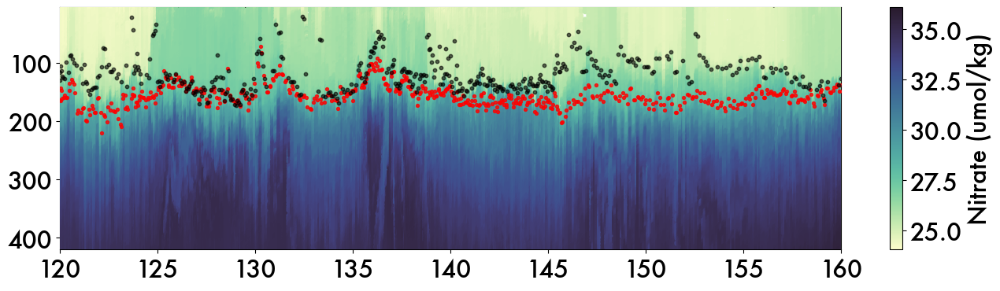

In [260]:
# figure: single glider section
glidtag = 'sg660'
# sns.set_palette("Greys")
fig = plt.figure(figsize=(16,4)) # 16,4
ax = fig.gca()


df_glid = df_660[df_660.pressure<420]
sca = ax.scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate, cmap=cmo.deep, s=10, zorder=3)

sns.set_palette("Reds")
# for sigma in [27.25]:
#     ax.scatter(isosignal_660[sigma].yearday, isosignal_660[sigma].pressure, c = 'r', s=12, label=sigma, alpha=0.8, zorder=3)

ax.scatter(isosignal_660[27.25].yearday, isosignal_660[27.25].pressure, 
            c = 'r', s=8, label=sigma, alpha=0.8, zorder=3)

ax.scatter(dav_660.yearday, dav_660.mld, s=10, c='k', alpha=0.6, zorder=3)
ax.set_xlim([120, 160])
ax.grid(zorder=1)
ax.invert_yaxis()
ax.set_ylim([420,5])

# plt.legend(fontsize=18, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)
plt.colorbar(sca).set_label('Nitrate (umol/kg)', fontsize=22)

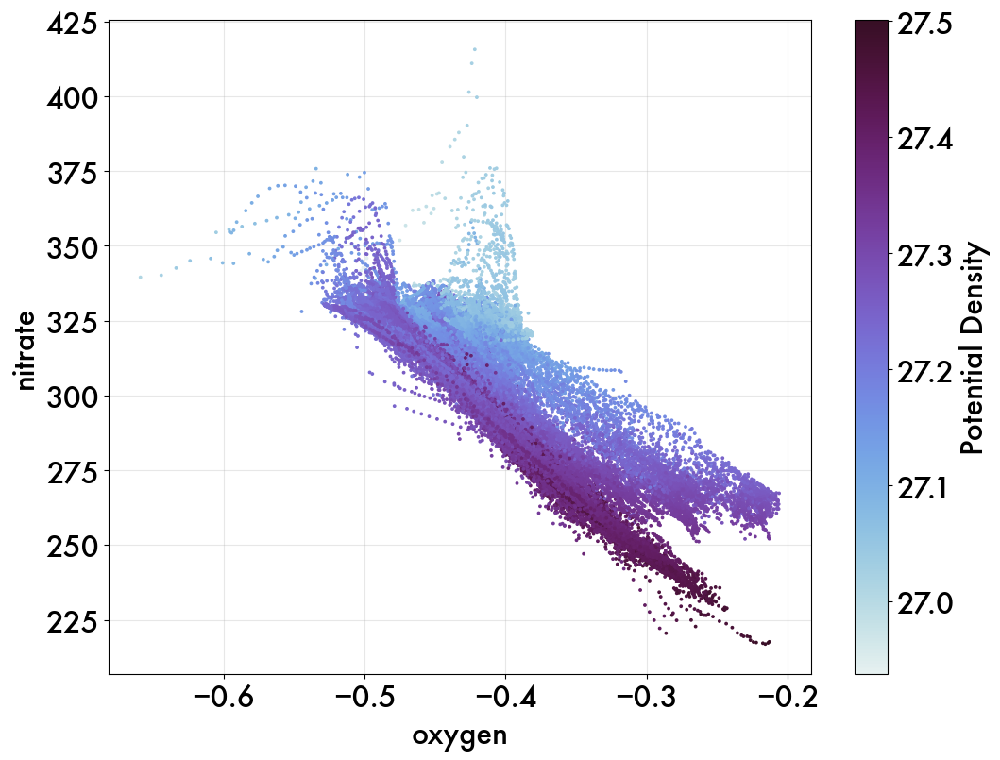

In [305]:
# spice vs. bgc
# df = RF_ver[4]['Model_G']
df = df_660[df_660.pressure<200]

fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.spice, df.oxygen, c=df.sigma0, s=3, cmap = cmo.dense, zorder=3)
# plt.plot([0, 40], [0, 40], 'k--', linewidth=1, alpha=0.3, zorder=0)
cbar = plt.colorbar()
cbar.set_label('Potential Density')


ax.set_xlabel('oxygen')
ax.set_ylabel('nitrate')



ax.grid(alpha=0.3, zorder=1)


In [ ]:

# Assuming 'df' is your DataFrame and 'bbp470' is the column containing the values
Q1 = df['bbp470'].quantile(0.25)
Q3 = df['bbp470'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to keep rows within the bounds (i.e., not outliers)
filtered_df = df[(df['bbp470'] >= lower_bound) & (df['bbp470'] <= upper_bound)]

In [148]:
df_660

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate,AOU
0,4,119.510598,-51.4952,30.0253,8.070,3.646773,33.958220,327.518402,27.012310,-10.656217,...,-0.500000,0.866025,4,6600000,NaN,0.000454,0.000227,0.2074,23.795241,-7.102091
1,5,119.510656,-51.4952,30.0253,9.079,3.631773,33.962220,327.685360,27.016935,-9.863941,...,-0.500000,0.866025,4,6600000,NaN,0.000501,0.000227,0.2074,24.082526,-7.162160
2,6,119.510714,-51.4952,30.0254,10.088,3.612773,33.967220,327.686533,27.022739,-10.883128,...,-0.500000,0.866025,4,6600000,NaN,0.000471,0.000233,0.2379,24.102845,-7.027678
3,7,119.510772,-51.4951,30.0254,11.097,3.615773,33.965220,327.512713,27.020866,-11.794115,...,-0.500000,0.866025,4,6600000,NaN,0.000501,0.000240,0.2684,24.093631,-6.872304
4,8,119.510830,-51.4951,30.0254,12.106,3.612773,33.969220,327.396822,27.024322,-10.664905,...,-0.500000,0.866025,4,6600000,NaN,0.000489,0.000223,0.3294,24.096455,-6.742980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737002,947960,205.873787,-51.5287,39.0112,965.631,2.114773,34.873222,182.046058,27.875646,-12.497102,...,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.223466,148.350737
737003,947961,205.873700,-51.5287,39.0112,966.645,2.114773,34.874220,182.106957,27.876441,-12.497102,...,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.223297,148.287263
737004,947963,205.873498,-51.5287,39.0112,968.672,2.114773,34.874220,182.209926,27.876441,-12.494619,...,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.224032,148.184300
737005,947964,205.873382,-51.5287,39.0112,969.685,2.114773,34.875220,182.221260,27.877237,-12.494619,...,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.193658,148.170391


(120.0, 160.0)

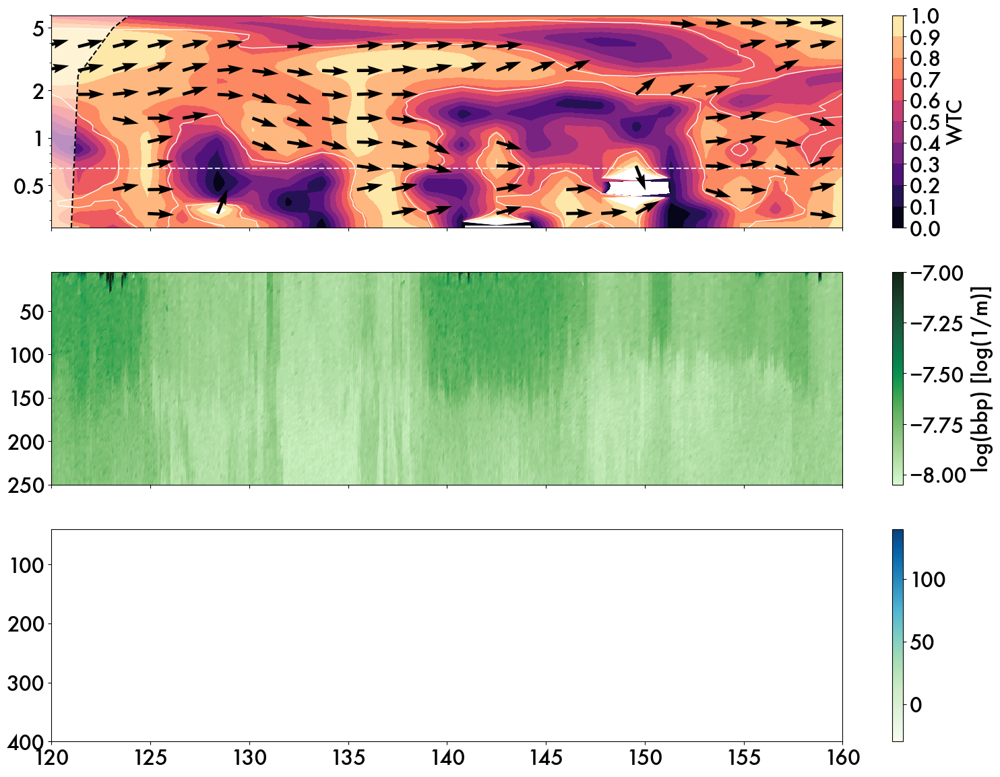

In [490]:
#presfig: 

fig, axs = plt.subplots(3,1, figsize=(16, 12), sharex=True, layout='tight')
axs = axs.flatten()

cohfig = coh_signif_660[27.25].plot(ax=axs[0], title=tag, contourf_style={'cmap':'magma'}, 
                             phase_style = {'skip_x':1, 'skip_y':6, 'width':.004, 'scale':30})
axs[0].set_xlim([120, 160])
# coh_oxynit_signif_660[sigma].plot(ax=axs[1], title=tag, contourf_style={'cmap':'YlGnBu_r'}, phase_style = phase_args)
# coh_oxyspice_signif_660[sigma].plot(ax=axs[2], title=tag, contourf_style={'cmap':cmo.ice}, phase_style = phase_args)  
# ax.set_title(tag)



dat = df_660[df_660.pressure<250]
dat = dat[dat.yearday<160]
sca = axs[1].scatter(dat.yearday, dat.pressure, c=np.log(dat.bbp470), cmap=cmo.algae, s=40, vmin= -8.05, vmax=-7)
plt.colorbar(sca, ax=axs[1]).set_label('log(bbp) [log(1/m)]', fontsize=22)

dat = df_660[df_660.pressure<400]
dat = dat[(dat.yearday<160) & (dat.yearday>120.2)]
# aousca = axs[2].scatter(dat.yearday, dat.pressure, c=dat.AOU, cmap='GnBu', s=10, zorder=3, vmin=-30, vmax=140)
plt.colorbar(aousca, ax=axs[2])


axs[0].hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
axs[0].set_ylim([0.27, 6])


for ax in axs:
    ax.set_title('')
    ax.set_ylabel('')
    ax.set_xlabel('')


for ax in axs[1:]:
    ax.invert_yaxis()
    # ax.set_ylabel('pressure')
axs[1].set_ylim([250, 5])
axs[2].set_ylim([400, 40])
axs[2].set_xlim([120, 160])


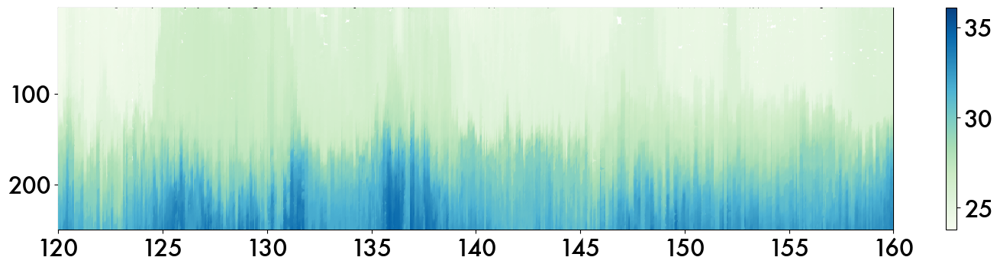

In [310]:
fig = plt.figure(figsize=(15,4), layout="tight")
ax=fig.gca()

dat = df_660[df_660.pressure<250]
dat = dat[dat.yearday<160]

# sca = ax.scatter(dat.yearday, dat.pressure, c=np.log(dat.bbp470), cmap=cmo.algae, s=40, vmin= -8.05, vmax=-7)
sca = ax.scatter(df_glid.yearday, df_glid.pressure,c=df_glid.nitrate, cmap='GnBu', s=10, zorder=3)


ax.invert_yaxis()
ax.set_xlim([120, 160])
ax.set_ylim([250, 5])
plt.colorbar(sca, ax=ax)

# Along-isopycnal Nitrate and Oxygen

In [253]:
glidname = 'sg660'
figtitle = glidname + ', along-iso nitrate wavelet'
fig, axs = plt.subplots(2,2, figsize=(22, 12), sharex=True, sharey=True)
# axs = axs.flatten()

ave_isopycnal_660[0:7:2]

for ind, sigma in enumerate(ave_isopycnal_660[0:3:2]):
    coh = coh_oxynit_660[sigma]
    coh.plot(ax=axs[ind, 0])
    axs[ind,0].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ind, sigma in enumerate(ave_isopycnal_660[4:7:2]):
    coh = coh_oxynit_660[sigma]
    coh.plot(ax=axs[ind, 1])
    axs[ind,1].set_title(r'$\sigma$' + ' = ' + str(sigma))

for ax in axs.flatten():
    ax.hlines(0.643, 120, 205, color='w', linestyles='dashed', alpha=0.8, label='inertial period', zorder=3)
    ax.set_xlabel('')
    ax.set_ylabel('')

{27.1: 84.71,
 27.15: 102.43,
 27.2: 126.28,
 27.25: 148.35,
 27.3: 174.63,
 27.35: 196.59,
 27.4: 223.68,
 27.45: 256.91,
 27.5: 296.8,
 27.55: 343.46,
 27.6: 396.92,
 27.65: 460.03}

In [350]:
dat = isosignal[27.15]
dat[dat.yearday<160]

,yearday,pressure,sigma0,nitrate_28t,spice,oxygen,AOU
0,119.579389,134.211000,27.151203,25.668739,-0.413198,325.547756,-0.062244
0,119.590743,136.230000,27.157255,25.961402,-0.418340,319.029352,6.927027
0,119.623417,142.286667,27.150398,25.705137,-0.414420,325.667391,-0.153809
0,119.655662,139.763000,27.152989,25.530616,-0.430265,322.200786,4.152230
0,119.692693,137.239000,27.144889,25.446291,-0.412530,332.182299,-6.966885
...,...,...,...,...,...,...,...
0,159.619726,92.288927,27.146287,25.449796,-0.460904,326.611267,0.943038
0,159.754039,65.248700,27.145422,25.464917,-0.464699,326.719869,0.983973
0,159.781152,71.302772,27.146899,25.469856,-0.464126,327.173312,0.561701
0,159.918487,77.616365,27.146445,25.469934,-0.463329,326.145434,1.532679


<Figure size 900x900 with 0 Axes>

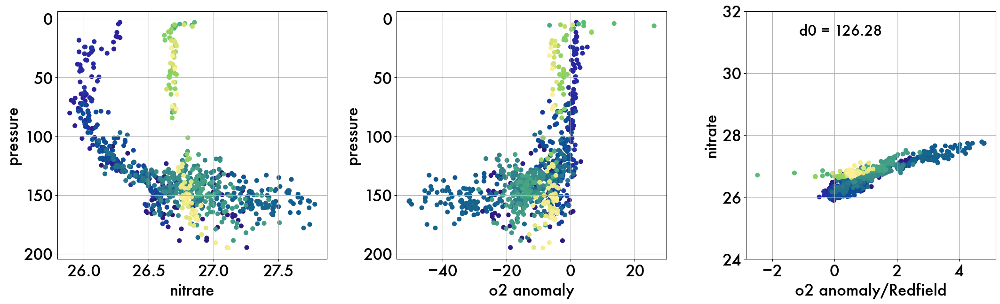

In [348]:
fig = plt.figure(figsize=(9,9), layout="tight")

fig, axs = plt.subplots(1, 3, figsize=(22,7), layout="tight")
axs = axs.flatten()

key = 27.2
d0 = 'd0 = ' + str(d0_dict[key])

nitdat = isosignal[key].nitrate_28t
presdat = isosignal[key].pressure
oxdat = -isosignal[key].AOU   # AOU is negative oxygen anomaly
redfield = -10.5

sca = axs[0].scatter(nitdat, presdat, c=isosignal[key].yearday, cmap=cmo.haline, label=d0, s=40)
axs[1].scatter(oxdat, presdat, c=isosignal[key].yearday, cmap=cmo.haline, s=40)

axs[2].scatter(oxdat/redfield, nitdat, c=isosignal[key].yearday, cmap=cmo.haline, label=d0,  s=40)
axs[2].plot([min(oxdat/redfield), max(oxdat/redfield)], [min(oxdat/redfield), max(oxdat/redfield)])

for ax in axs: 
    ax.grid(zorder=1)
    

for ax in axs[:2]:
    ax.set_ylabel('pressure')
    ax.invert_yaxis()
    

axs[2].set_ylabel('nitrate')

axs[0].set_xlabel('nitrate')
axs[1].set_xlabel('o2 anomaly')
axs[2].set_xlabel('o2 anomaly/Redfield')

axs[2].set_ylim([24,32])
axs[2].set_aspect('equal')
# axs[2].plot([-2,24], [6,32])

axs[2].legend(edgecolor='w', facecolor='w', framealpha=0, fontsize=22, loc='upper left')
# plt.colorbar(sca, ax=axs[0])

In [339]:
fig = plt.figure(figsize=(9,9), layout="tight")

fig, axs = plt.subplots(1, 3, figsize=(22,7), layout="tight")
axs = axs.flatten()

key = 27.2
d0 = 'd0 = ' + str(d0_dict[key])

nitdat = isosignal[key].nitrate_28t
presdat = isosignal[key].pressure
oxdat = -isosignal[key].AOU   # AOU is negative oxygen anomaly
redfield = -10.5

sca = axs[0].scatter(nitdat, presdat, c=isosignal[key].yearday, cmap=cmo.haline, label=d0, s=40)
axs[1].scatter(oxdat, presdat, c=isosignal[key].yearday, cmap=cmo.haline, s=40)

axs[2].scatter(oxdat/redfield, nitdat, c=isosignal[key].yearday, cmap=cmo.haline, label=d0,  s=40)
axs[2].plot([min(oxdat/redfield), max(oxdat/redfield)], [min(oxdat/redfield), max(oxdat/redfield)])

for ax in axs: 
    ax.grid(zorder=1)
    

for ax in axs[:2]:
    ax.set_ylabel('pressure')
    ax.invert_yaxis()
    

axs[2].set_ylabel('nitrate')

axs[0].set_xlabel('nitrate')
axs[1].set_xlabel('o2 anomaly')
axs[2].set_xlabel('o2 anomaly/Redfield')

axs[2].set_ylim([24,32])
axs[2].set_aspect('equal')
# axs[2].plot([-2,24], [6,32])

axs[2].legend(edgecolor='w', facecolor='w', framealpha=0, fontsize=22, loc='upper left')
# plt.colorbar(sca, ax=axs[0])

AttributeError: module 'sgmod_main' has no attribute 'list_profiles'

# Power spectral density using multiple series


In [ ]:
def make_along_iso_surfs(isosignal, sigma):
    "Returns standardized pyleo surface for along-isopycnal analysis"
    spice_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma].spice, label = sigma,
                  time_name = 'Time', value_name = 'Spice',
                  time_unit = 'days',   value_unit = 's') 
    
    nitrate_surf = pyleo.Series(time =  isosignal[sigma].yearday, value = isosignal[sigma].nitrate_28t, label = sigma,
                time_name = 'Time', value_name = 'Nitrate',
                time_unit = 'days',   value_unit = 'umol/kg') 

    return spice_surf.standardize(), nitrate_surf.standardize()

spice_surfs = dict.fromkeys(ave_isopycnal)
nitrate_surfs = dict.fromkeys(ave_isopycnal)

for sigma in ave_isopycnal:
    [spice_surfs[sigma], nitrate_surfs[sigma]] = make_along_iso_surfs(isosignal, sigma)
    # nitrate_surfs[sigma]] 

Performing spectral analysis on individual series: 100%|██████████| 2/2 [00:08<00:00,  4.09s/it]


(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot: xlabel='Period [days]', ylabel='PSD'>)

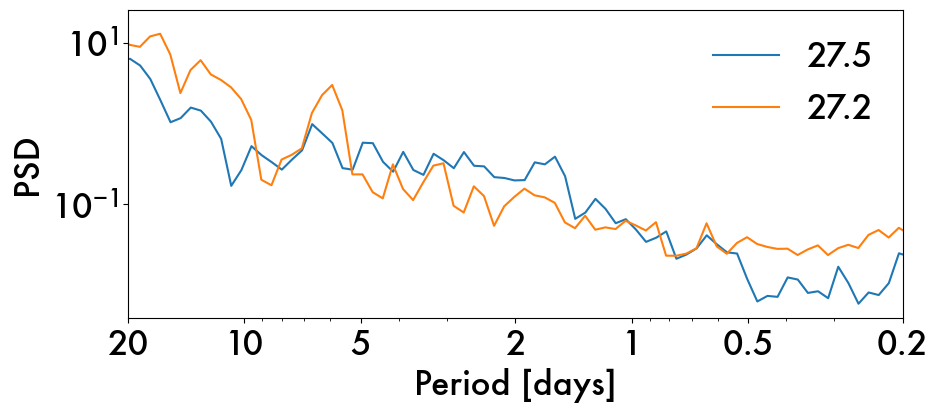

In [225]:
multest = pyleo.MultipleSeries([nitrate_surfs[27.5], nitrate_surfs[27.2]])
multest.standardize().spectral('wwz').plot()
